# Ross Sea synthetic gravity inversion

import packages

In [4]:
from __future__ import annotations

%load_ext autoreload
%autoreload 2

import copy
import logging
import os
import pathlib
import pickle
import string

import numpy as np
import scipy as sp
import verde as vd
import xarray as xr
from polartoolkit import maps, profiles
from polartoolkit import utils as polar_utils

import RIS_gravity_inversion.plotting as RIS_plotting
import RIS_gravity_inversion.synthetic as RIS_synth

os.environ["POLARTOOLKIT_HEMISPHERE"] = "south"

logging.getLogger().setLevel(logging.INFO)

from invert4geom import inversion, optimization, plotting, regional, uncertainty, utils

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Get synthetic model data

INFO:root:using preprocessed 5km grid since spacing is > 5km


INFO:root:returning grid with new region and/or registration, same spacing
INFO:root:returning grid with new region and/or registration, same spacing


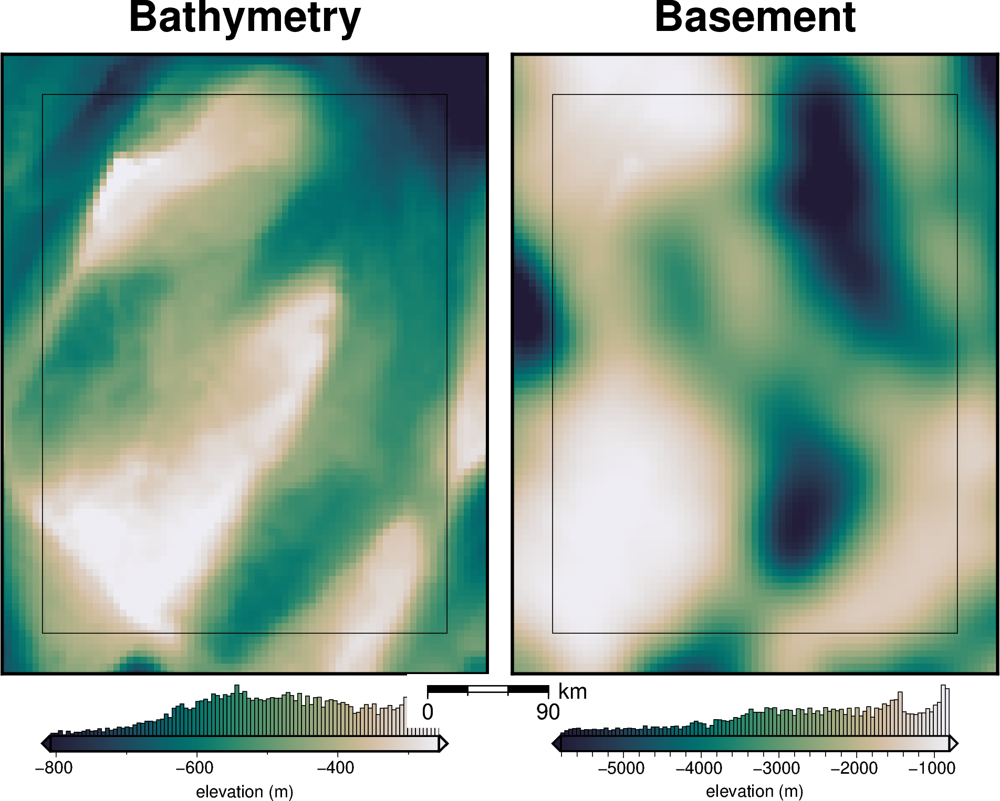

  0%|          | 0/4941 [00:00<?, ?it/s]

  0%|          | 0/4941 [00:00<?, ?it/s]

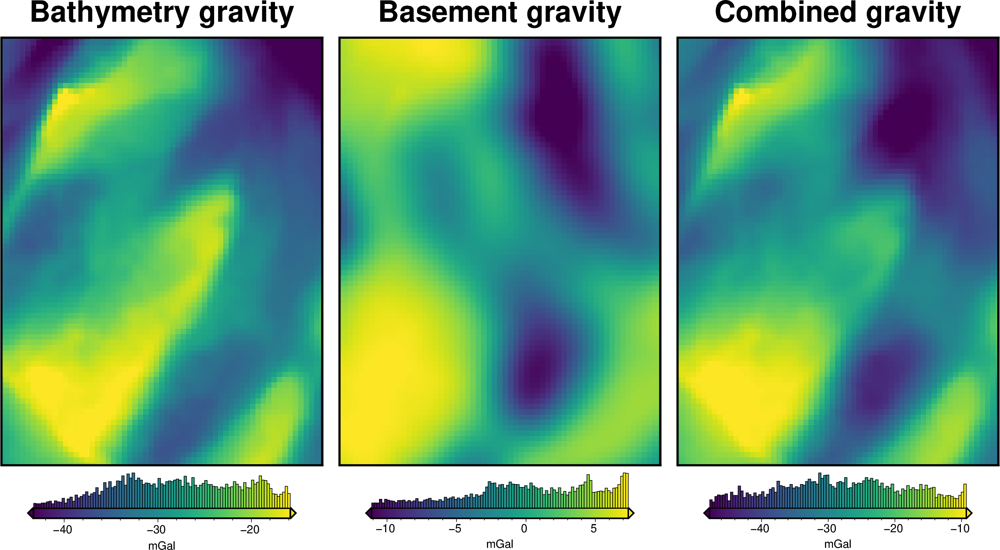

In [5]:
# set grid parameters
spacing = 5e3
inversion_region = (-40e3, 260e3, -1800e3, -1400e3)

true_density_contrast = 1476

bathymetry, basement, grav_df = RIS_synth.load_synthetic_model(
    spacing=spacing,
    buffer=spacing * 6,
    basement=True,
    # gravity_noise=0,
    zref=0,
    bathymetry_density_contrast=true_density_contrast,
)
buffer_region = polar_utils.get_grid_info(bathymetry)[1]

In [6]:
reg = grav_df.basement_grav
reg -= reg.mean()
utils.rmse(reg)

np.float64(5.0842773757391)

In [7]:
# normalize regional gravity between -1 and 1
grav_df["basement_grav_normalized"] = (
    vd.grid_to_table(
        utils.normalize_xarray(
            grav_df.set_index(["northing", "easting"]).to_xarray().basement_grav,
            low=-1,
            high=1,
        )
    )
    .reset_index()
    .basement_grav
)
grav_df = grav_df.drop(columns=["basement_grav", "disturbance", "gravity_anomaly"])

In [8]:
# re-scale the regional gravity
regional_grav = utils.normalize_xarray(
    grav_df.set_index(["northing", "easting"]).to_xarray().basement_grav_normalized,
    low=0,
    high=20,
).rename("basement_grav")
regional_grav -= regional_grav.mean()

# add to dataframe
grav_df["basement_grav"] = vd.grid_to_table(regional_grav).reset_index().basement_grav

# add basement and bathymetry forward gravities together to make observed gravity
grav_df["gravity_anomaly"] = grav_df.bathymetry_grav + grav_df.basement_grav

new_reg = grav_df.set_index(["northing", "easting"]).to_xarray().basement_grav
new_reg -= new_reg.mean()
print(utils.rmse(new_reg))

4.918110536633229


In [9]:
grav_df

,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly
0,-1800000.0,-40000.0,1000.0,-28.046289,0.830177,5.710065,-22.336224
1,-1800000.0,-35000.0,1000.0,-26.714502,0.867672,6.085010,-20.629492
2,-1800000.0,-30000.0,1000.0,-25.919276,0.898289,6.391175,-19.528100
3,-1800000.0,-25000.0,1000.0,-25.236960,0.921973,6.628021,-18.608940
4,-1800000.0,-20000.0,1000.0,-24.610928,0.937189,6.780179,-17.830750
...,...,...,...,...,...,...,...
4936,-1400000.0,240000.0,1000.0,-48.323584,0.243973,-0.151982,-48.475566
4937,-1400000.0,245000.0,1000.0,-48.356131,0.167427,-0.917439,-49.273571
4938,-1400000.0,250000.0,1000.0,-49.079005,0.076264,-1.829069,-50.908074
4939,-1400000.0,255000.0,1000.0,-49.877171,-0.022265,-2.814361,-52.691532


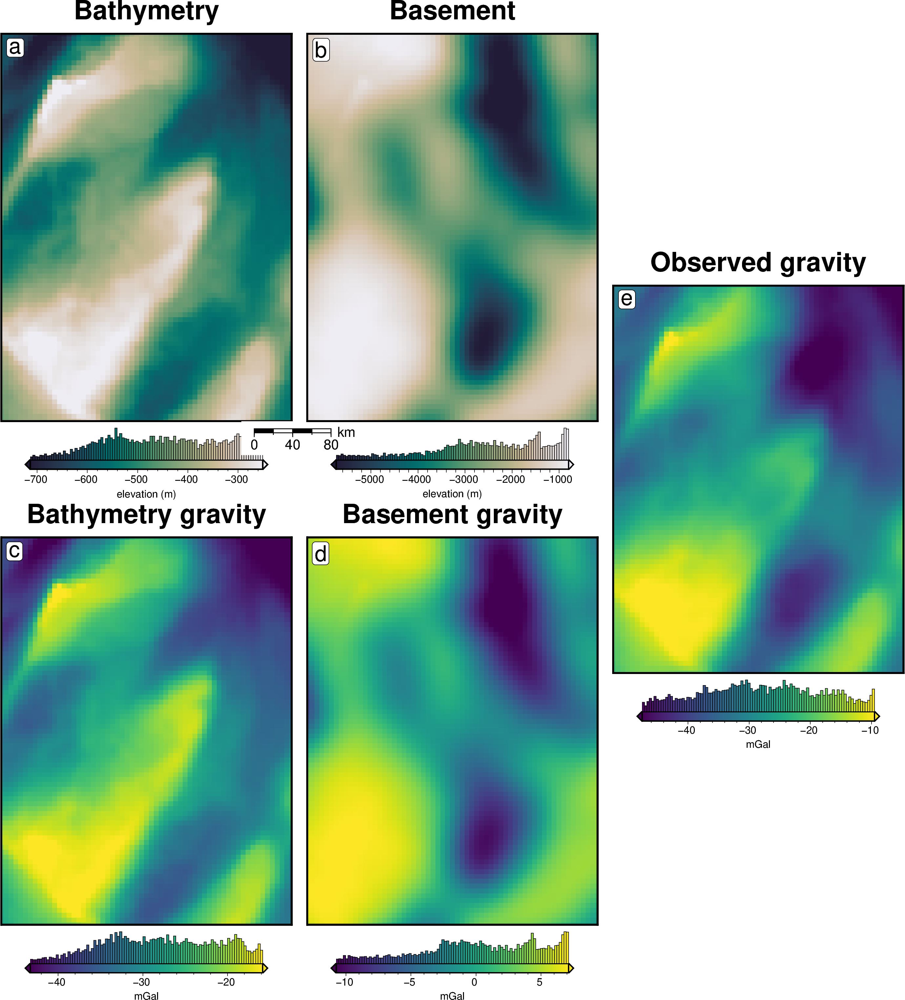

In [10]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

fig = maps.plot_grd(
    bathymetry,
    region=inversion_region,
    fig_height=10,
    title="Bathymetry",
    hist=True,
    cbar_yoffset=1,
    cmap="rain",
    reverse_cpt=True,
    cbar_label="elevation (m)",
    robust=True,
)
fig.text(
    position="TL",
    text="a",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

fig = maps.plot_grd(
    basement,
    region=inversion_region,
    fig_height=10,
    title="Basement",
    hist=True,
    cbar_yoffset=1,
    cmap="rain",
    reverse_cpt=True,
    cbar_label="elevation (m)",
    fig=fig,
    origin_shift="xshift",
    robust=True,
    # frame=["nSEw", "xaf10000", "yaf10000"],
    scalebar=True,
    scale_position="n-.05/-.03",
)
fig.text(
    position="TL",
    text="b",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# shift down and 3 to the left
fig = maps.plot_grd(
    grav_grid.bathymetry_grav,
    region=inversion_region,
    fig_height=10,
    title="Bathymetry gravity",
    hist=True,
    cbar_yoffset=1,
    cbar_label="mGal",
    fig=fig,
    origin_shift="both",
    xshift_amount=-1,
    yshift_amount=-1,
    robust=True,
)
fig.text(
    position="TL",
    text="c",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
fig = maps.plot_grd(
    grav_grid.basement_grav,
    region=inversion_region,
    fig_height=10,
    title="Basement gravity",
    hist=True,
    cbar_yoffset=1,
    cbar_label="mGal",
    fig=fig,
    origin_shift="xshift",
    robust=True,
)
fig.text(
    position="TL",
    text="d",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    region=inversion_region,
    fig_height=10,
    title="Observed gravity",
    hist=True,
    cbar_yoffset=1,
    cbar_label="mGal",
    fig=fig,
    origin_shift="both",
    yshift_amount=0.5,
    robust=True,
)
fig.text(
    position="TL",
    text="e",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

fig.show()

# Make starting bathymetry model

In [11]:
# semi-regularly spaced
constraint_points = RIS_synth.constraint_layout_number(
    shape=(4, 5),
    region=inversion_region,
    padding=-spacing,
)

# sample true topography at these points
constraint_points = utils.sample_grids(
    constraint_points,
    bathymetry,
    "true_upward",
    coord_names=("easting", "northing"),
)
constraint_points["upward"] = constraint_points.true_upward
constraint_points.head()

,northing,easting,true_upward,upward
0,-1756000.0,1250.0,-277.117397,-277.117397
1,-1756000.0,73750.0,-292.754172,-292.754172
2,-1756000.0,146250.0,-587.490438,-587.490438
3,-1756000.0,218750.0,-303.910608,-303.910608
4,-1678000.0,1250.0,-356.930926,-356.930926


In [12]:
# # re-sample depths with uncertainty to emulate measurement errors
# # set each points uncertainty equal to 2% of depth
# uncert = np.abs(0.02 * constraint_points.upward)
# constraint_points.loc[constraint_points.index, "uncert"] = uncert

# constraint_points = uncertainty.randomly_sample_data(
#     seed=0,
#     data_df=constraint_points,
#     data_col="upward",
#     uncert_col="uncert",
# )

# # create weights column
# constraint_points["weight"] = 1 / (constraint_points.uncert**2)

# constraint_points.head()

In [13]:
# grid the sampled values using verde
starting_topography_kwargs = dict(
    method="splines",
    region=buffer_region,
    spacing=spacing,
    constraints_df=constraint_points,
    dampings=None,
)

starting_bathymetry = utils.create_topography(**starting_topography_kwargs)

starting_bathymetry

<xarray.DataArray 'scalars' (northing: 93, easting: 73)> Size: 54kB
array([[-306.27646204, -301.11328455, -296.14330811, ..., -136.72275749,
        -133.56247234, -130.90278552],
       [-309.23858022, -303.98041825, -298.91207899, ..., -141.4887454 ,
        -138.50192797, -136.02065391],
       [-312.27191015, -306.91508978, -301.74433524, ..., -146.43003056,
        -143.64038179, -141.35749105],
       ...,
       [-928.66251693, -917.88043654, -906.84555987, ..., -854.58896833,
        -862.85099753, -870.81154897],
       [-938.2697604 , -927.29383174, -916.05662461, ..., -859.61863513,
        -868.01943284, -876.12134531],
       [-947.80748693, -936.6526941 , -925.23245144, ..., -864.83953674,
        -873.35985613, -881.58608866]])
Coordinates:
  * easting   (easting) float64 584B -7e+04 -6.5e+04 -6e+04 ... 2.85e+05 2.9e+05
  * northing  (northing) float64 744B -1.83e+06 -1.825e+06 ... -1.37e+06
Attributes:
    metadata:  Generated by SplineCV(cv=KFold(n_splits=5, random_state=0, shu...
    damping:   None

In [14]:
# sample the inverted topography at the constraint points
constraint_points = utils.sample_grids(
    constraint_points,
    starting_bathymetry,
    "starting_bathymetry",
    coord_names=("easting", "northing"),
)

rmse = utils.rmse(constraint_points.upward - constraint_points.starting_bathymetry)
print(f"RMSE: {rmse:.2f} m")

RMSE: 0.19 m


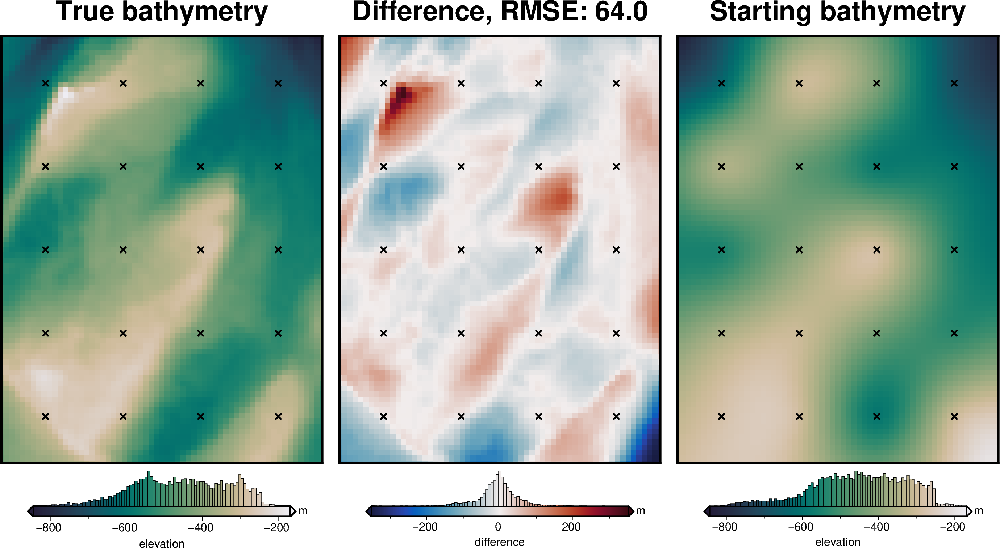

In [15]:
# compare starting and actual bathymetry grids
grids = polar_utils.grd_compare(
    bathymetry,
    starting_bathymetry,
    fig_height=10,
    plot=True,
    plot_type="pygmt",
    cmap="rain",
    reverse_cpt=True,
    diff_cmap="balance+h0",
    grid1_name="True bathymetry",
    grid2_name="Starting bathymetry",
    title="Difference",
    title_font="18p,Helvetica-Bold,black",
    cbar_unit="m",
    cbar_label="elevation",
    RMSE_decimals=0,
    region=inversion_region,
    inset=False,
    hist=True,
    cbar_yoffset=1,
    label_font="16p,Helvetica,black",
    points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
    points_style="x.2c",
)

In [16]:
# the true density contrast is 1476 kg/m3
density_contrast = 1350

# set the reference level from the prisms to 0
zref = 0

density_grid = xr.where(
    starting_bathymetry >= zref,
    density_contrast,
    -density_contrast,
)

# create layer of prisms
starting_prisms = utils.grids_to_prisms(
    starting_bathymetry,
    zref,
    density=density_grid,
)

grav_df["starting_gravity"] = starting_prisms.prism_layer.gravity(
    coordinates=(
        grav_df.easting,
        grav_df.northing,
        grav_df.upward,
    ),
    field="g_z",
    progressbar=True,
)

grav_df

  0%|          | 0/4941 [00:00<?, ?it/s]

,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly,starting_gravity
0,-1800000.0,-40000.0,1000.0,-28.046289,0.830177,5.710065,-22.336224,-16.300420
1,-1800000.0,-35000.0,1000.0,-26.714502,0.867672,6.085010,-20.629492,-16.069866
2,-1800000.0,-30000.0,1000.0,-25.919276,0.898289,6.391175,-19.528100,-15.845227
3,-1800000.0,-25000.0,1000.0,-25.236960,0.921973,6.628021,-18.608940,-15.629333
4,-1800000.0,-20000.0,1000.0,-24.610928,0.937189,6.780179,-17.830750,-15.424289
...,...,...,...,...,...,...,...,...
4936,-1400000.0,240000.0,1000.0,-48.323584,0.243973,-0.151982,-48.475566,-42.088044
4937,-1400000.0,245000.0,1000.0,-48.356131,0.167427,-0.917439,-49.273571,-42.673106
4938,-1400000.0,250000.0,1000.0,-49.079005,0.076264,-1.829069,-50.908074,-43.214539
4939,-1400000.0,255000.0,1000.0,-49.877171,-0.022265,-2.814361,-52.691532,-43.711150


## Regional misfit

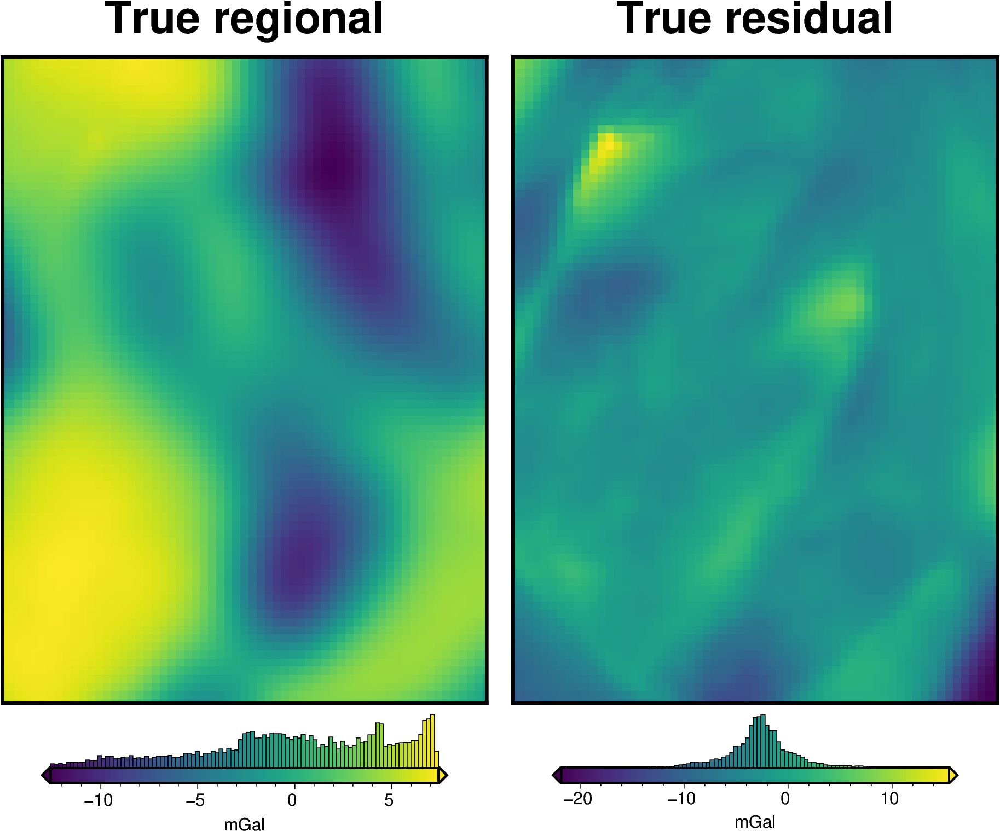

In [17]:
# calculate the true residual misfit
grav_df["true_res"] = grav_df.bathymetry_grav - grav_df.starting_gravity

# grid the results
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

fig = maps.plot_grd(
    grav_grid.basement_grav,
    fig_height=10,
    title="True regional",
    hist=True,
    cbar_yoffset=1,
    cbar_label="mGal",
)

fig = maps.plot_grd(
    grav_grid.true_res,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="True residual",
    hist=True,
    cbar_yoffset=1,
    cbar_label="mGal",
)

fig.show()

In [18]:
def regional_comparison(df):
    # grid the results
    grav_grid = df.set_index(["northing", "easting"]).to_xarray()

    # compare with true regional
    _ = polar_utils.grd_compare(
        grav_grid.basement_grav,
        grav_grid.reg,
        plot=True,
        grid1_name="True regional misfit",
        grid2_name="Regional misfit",
        hist=True,
        cbar_yoffset=1,
        inset=False,
        verbose="q",
        title="difference",
        grounding_line=False,
        points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
        points_style="x.3c",
    )
    # compare with true residual
    _ = polar_utils.grd_compare(
        grav_grid.true_res,
        grav_grid.res,
        plot=True,
        grid1_name="True residual misfit",
        grid2_name="Residual misfit",
        cmap="balance+h0",
        hist=True,
        cbar_yoffset=1,
        inset=False,
        verbose="q",
        title="difference",
        grounding_line=False,
        points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
        points_style="x.3c",
    )

  0%|          | 0/500 [00:00<?, ?it/s]

INFO:invert4geom:Trial with best score: 
INFO:invert4geom:	trial number: 320
INFO:invert4geom:	parameter: {'depth': 55625.41336716482, 'damping': 3.7848984581549925e-16}
INFO:invert4geom:	scores: [0.2530688474008344]


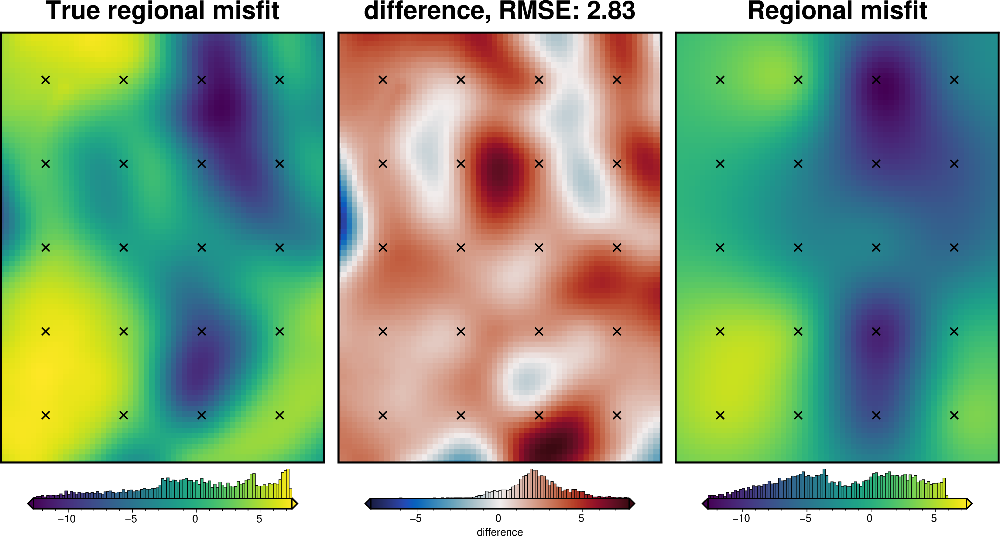

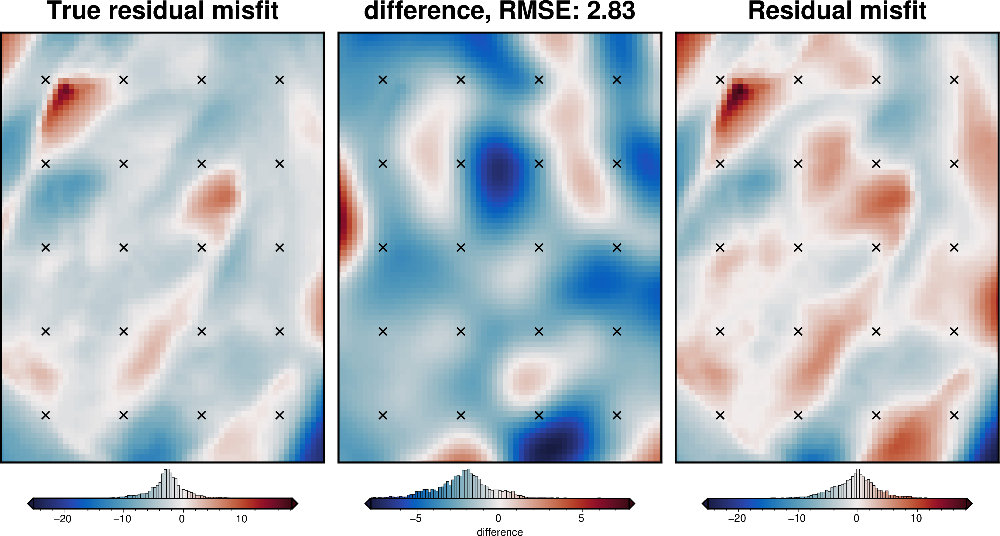

,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly,starting_gravity,true_res,misfit,reg,res
count,4.941000e+03,4941.00000,4941.0,4941.000000,4941.000000,4.941000e+03,4941.000000,4941.000000,4941.000000,4941.000000,4941.000000,4941.000000
mean,-1.600000e+06,110000.00000,1000.0,-28.076339,0.259171,7.362839e-16,-28.076339,-25.307651,-2.768688,-2.768688,-2.149930,-0.618758
std,1.169164e+05,88042.99419,0.0,7.267542,0.491861,4.918608e+00,10.294668,6.711159,3.562824,6.396750,4.628314,4.339043
min,-1.800000e+06,-40000.00000,1000.0,-50.834525,-1.000000,-1.259171e+01,-54.678282,-45.345114,-21.813657,-23.068609,-12.701475,-25.113723
25%,-1.700000e+06,35000.00000,1000.0,-33.380910,-0.034308,-2.934787e+00,-35.726921,-29.776032,-4.196784,-7.025801,-5.828493,-2.804867
50%,-1.600000e+06,110000.00000,1000.0,-28.037682,0.288825,2.965387e-01,-28.106720,-25.021326,-2.662141,-2.659198,-2.172653,-0.278670
75%,-1.500000e+06,185000.00000,1000.0,-21.983838,0.677359,4.181878e+00,-20.290869,-20.119406,-1.171641,1.959110,1.811257,1.722027
max,-1.400000e+06,260000.00000,1000.0,-13.088736,1.000000,7.408290e+00,-6.187838,-10.254375,15.502742,21.041465,5.808279,18.172110


In [19]:
# estimate regional with the mean misfit at constraints
regional_grav_kwargs = dict(
    method="constraints",
    grid_method="eq_sources",
    constraints_df=constraint_points,
    cv=True,
    cv_kwargs=dict(
        n_trials=500,
        damping_limits=(1e-30, 10),
        depth_limits=(100, 200e3),
        progressbar=False,
        fname="tmp/regional_sep",
    ),
    block_size=None,
)

temp_reg_kwargs = copy.deepcopy(regional_grav_kwargs)

# temporarily set some kwargs
temp_reg_kwargs["cv_kwargs"]["plot"] = True
temp_reg_kwargs["cv_kwargs"]["progressbar"] = True

grav_df = regional.regional_separation(
    grav_df=grav_df,
    **temp_reg_kwargs,
)

regional_comparison(grav_df)
grav_df.describe()

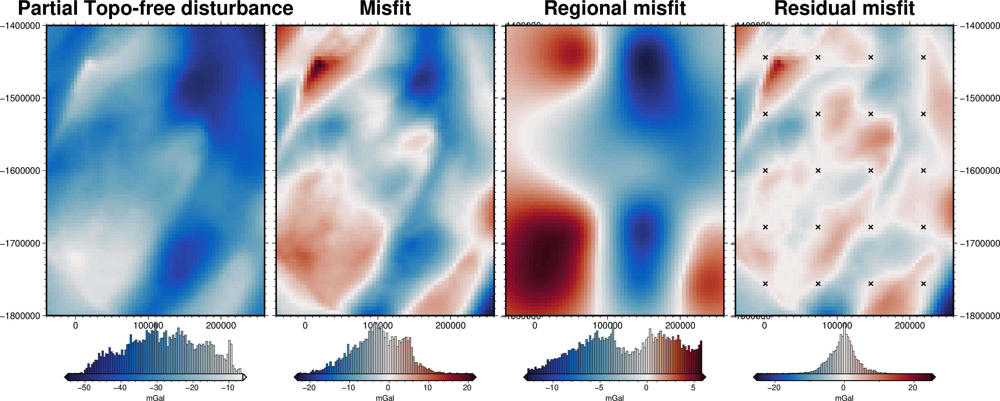

In [20]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    region=inversion_region,
    fig_height=10,
    title="Partial Topo-free disturbance",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSWe", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.misfit,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.reg,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Regional misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.res,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Residual misfit",
    cmap="balance+h0",
    cpt_lims=[-vd.maxabs(grav_grid.res), vd.maxabs(grav_grid.res)],
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
    points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
    points_style="x.2c",
)
fig.show()

In [21]:
# set kwargs to pass to the inversion
kwargs = {
    # set stopping criteria
    "max_iterations": 200,
    "l2_norm_tolerance": 0.2**0.5,  # square root of the gravity noise
    "delta_l2_norm_tolerance": 1.008,
}

# Damping Cross Validation

INFO:invert4geom:saving all results with root name '../../results/Ross_Sea_06_damping_cv'
INFO:invert4geom:running damping cross validation


  0%|          | 0/8 [00:00<?, ?it/s]

INFO:invert4geom:Trial with best score: 
INFO:invert4geom:	trial number: 2
INFO:invert4geom:	parameter: {'damping': 0.024577958705414526}
INFO:invert4geom:	scores: [0.07931881261928286]
INFO:invert4geom:results saved to ../../results/Ross_Sea_06_damping_cv_results.pickle.pickle


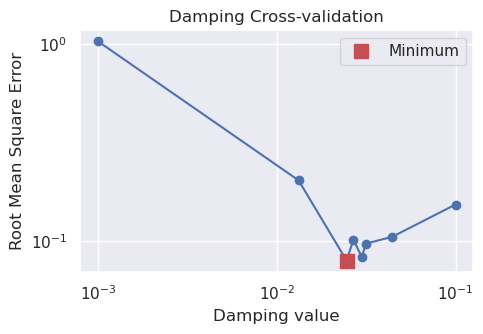

In [31]:
logging.getLogger().setLevel(logging.INFO)

# run the inversion workflow, including a cross validation for the damping parameter
results = inversion.run_inversion_workflow(
    grav_df=grav_df,
    starting_prisms=starting_prisms,
    # for creating test/train splits
    grav_spacing=spacing,
    inversion_region=inversion_region,
    run_damping_cv=True,
    damping_limits=(0.001, 0.1),
    damping_cv_trials=8,
    plot_cv=True,
    fname="../../results/Ross_Sea_06_damping_cv",
    **kwargs,
)

# collect the results
topo_results, grav_results, parameters, elapsed_time = results

In [22]:
# load saved inversion results
with pathlib.Path("../../results/Ross_Sea_06_damping_cv_results.pickle").open(
    "rb"
) as f:
    results = pickle.load(f)

# load study
with pathlib.Path("../../results/Ross_Sea_06_damping_cv_damping_cv_study.pickle").open(
    "rb"
) as f:
    study = pickle.load(f)

# collect the results
topo_results, grav_results, parameters, elapsed_time = results

In [23]:
best_damping = parameters.get("Solver damping")
best_damping

0.024577958705414526

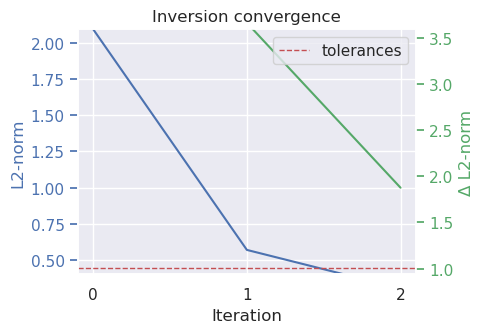

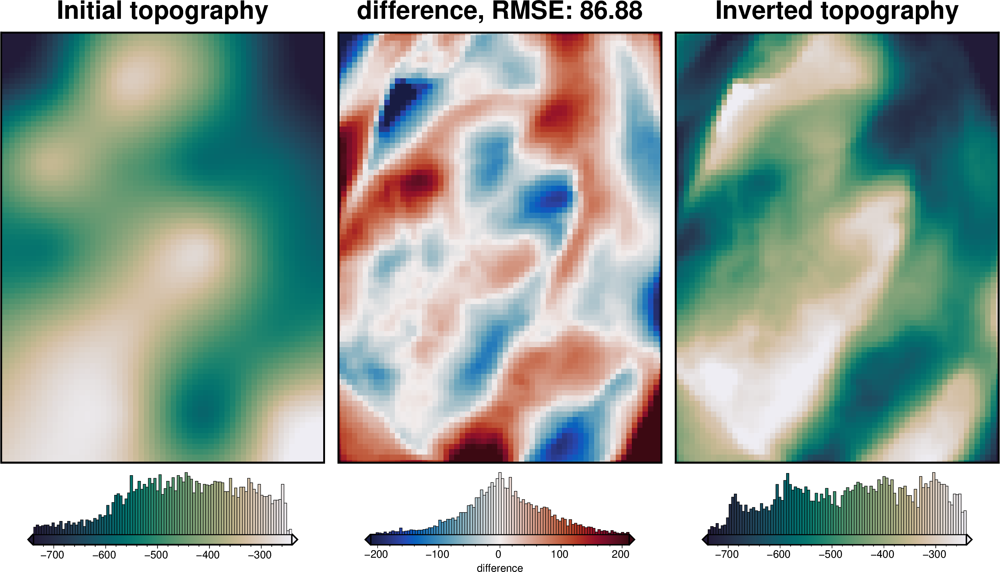

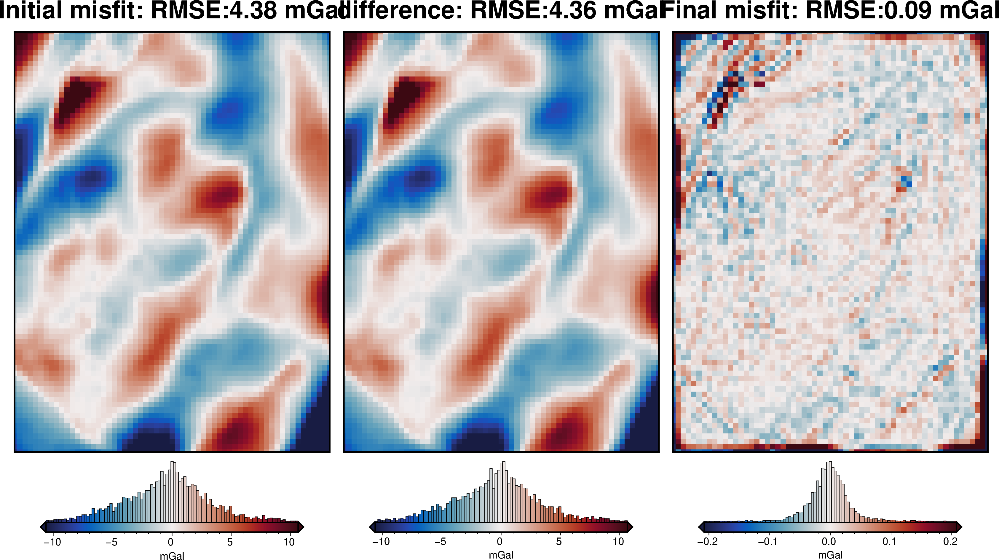

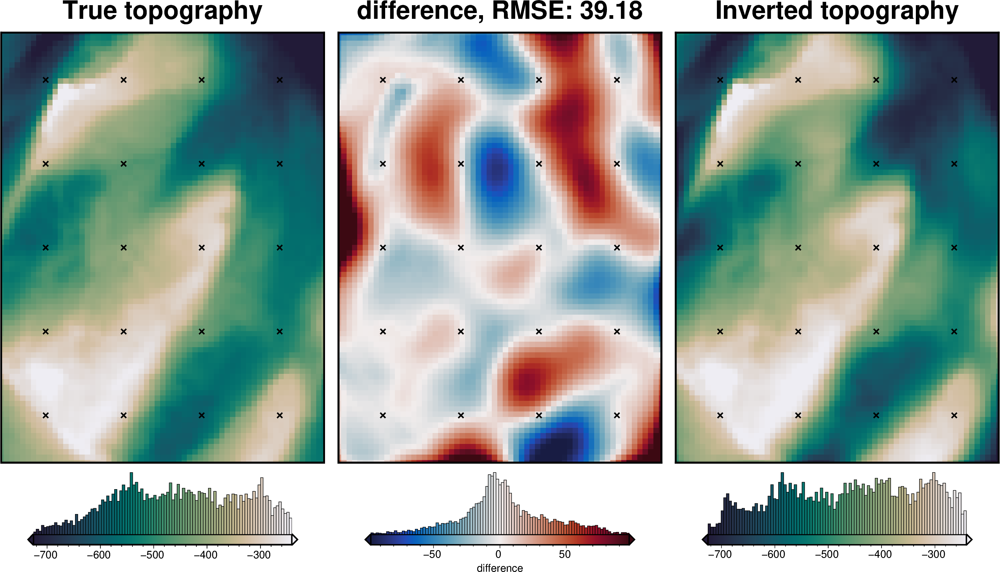

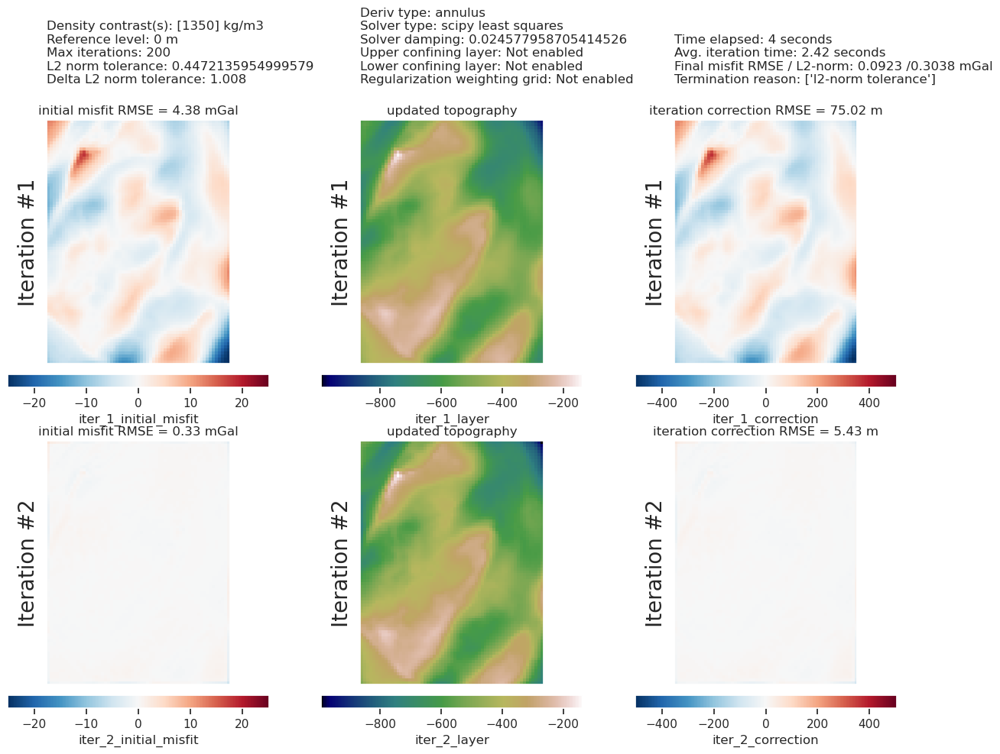

In [24]:
plotting.plot_convergence(
    grav_results,
    params=parameters,
)

plotting.plot_inversion_results(
    grav_results,
    topo_results,
    parameters,
    inversion_region,
    iters_to_plot=2,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
)

final_topography = topo_results.set_index(["northing", "easting"]).to_xarray().topo

_ = polar_utils.grd_compare(
    bathymetry,
    final_topography,
    region=inversion_region,
    plot=True,
    grid1_name="True topography",
    grid2_name="Inverted topography",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="difference",
    grounding_line=False,
    reverse_cpt=True,
    cmap="rain",
    points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
    points_style="x.2c",
)

In [25]:
# sample the inverted topography at the constraint points
constraint_points = utils.sample_grids(
    constraint_points,
    final_topography,
    "inverted_topography",
    coord_names=("easting", "northing"),
)

rmse = utils.rmse(constraint_points.upward - constraint_points.inverted_topography)
print(f"RMSE: {rmse:.2f} m")

RMSE: 3.61 m


## Density CV

In [36]:
# # run the cross validation for density
# study, inversion_results = optimization.optimize_inversion_zref_density_contrast(
#     grav_df=grav_df,
#     solver_damping=best_damping,
#     constraints_df=constraint_points,
#     density_contrast_limits=(1300, 3000),
#     zref=0,
#     n_trials=8,
#     starting_topography=starting_bathymetry,
#     regional_grav_kwargs=dict(
#         method="constant",
#         constraints_df=constraint_points,
#     ),
#     fname="../../results/Ross_Sea_04_density_cv",
#     **kwargs,
# )

INFO:invert4geom:Constraints split into 5 folds


  0%|          | 0/10 [00:00<?, ?it/s]

INFO:invert4geom:starting_topography not provided, creating a starting topography model with the supplied starting_topography_kwargs
INFO:invert4geom:Trial with best score: 
INFO:invert4geom:	trial number: 3
INFO:invert4geom:	parameter: {'density_contrast': 1525.0}
INFO:invert4geom:	scores: [64.65786064783455]


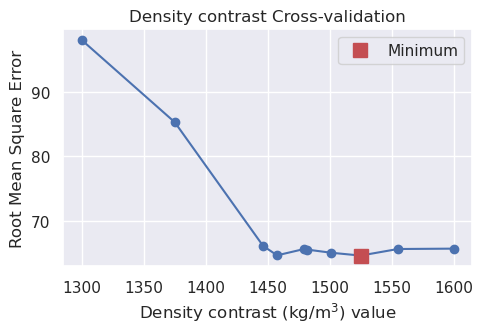

In [37]:
# run a 5-fold cross validation for 8 parameter sets of density
# this performs 40 regional separations and 40 inversions
study, inversion_results = optimization.optimize_inversion_zref_density_contrast_kfolds(
    grav_df=grav_df,
    solver_damping=best_damping,
    constraints_df=constraint_points,
    density_contrast_limits=(1300, 1600),
    zref=0,
    n_trials=10,
    split_kwargs=dict(
        n_splits=5,
        method="KFold",
    ),
    regional_grav_kwargs=regional_grav_kwargs,
    starting_topography_kwargs=starting_topography_kwargs,
    fname="../../results/Ross_Sea_06_density_cv",
    fold_progressbar=False,
    **kwargs,
)

In [26]:
# load saved inversion results
with pathlib.Path("../../results/Ross_Sea_06_density_cv_results.pickle").open(
    "rb"
) as f:
    inversion_results = pickle.load(f)

# load study
with pathlib.Path("../../results/Ross_Sea_06_density_cv_study.pickle").open("rb") as f:
    study = pickle.load(f)

# collect the results
topo_results, grav_results, parameters, elapsed_time = inversion_results

In [27]:
best_density_contrast = study.best_params["density_contrast"]
print("optimal determined density contrast", best_density_contrast)
print("real density contrast", true_density_contrast)

optimal determined density contrast 1525.0
real density contrast 1476


In [40]:
# # re-run using the above density contrast
# inversion_results = inversion.run_inversion_workflow(
#     grav_df=grav_df,
#     solver_damping=best_damping,
#     zref=0,
#     density_contrast=best_density_contrast,
#     fname="../../results/Ross_Sea_03",
#     create_starting_prisms=True,
#     starting_topography=starting_bathymetry,
#     calculate_regional_misfit=True,
#     plot_dynamic_convergence=True,
#     regional_grav_kwargs=regional_grav_kwargs,  # constraint point minimization
#     **kwargs,
# )
# topo_results, grav_results, parameters, elapsed_time = inversion_results

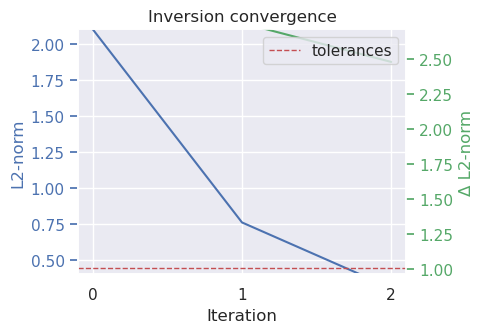

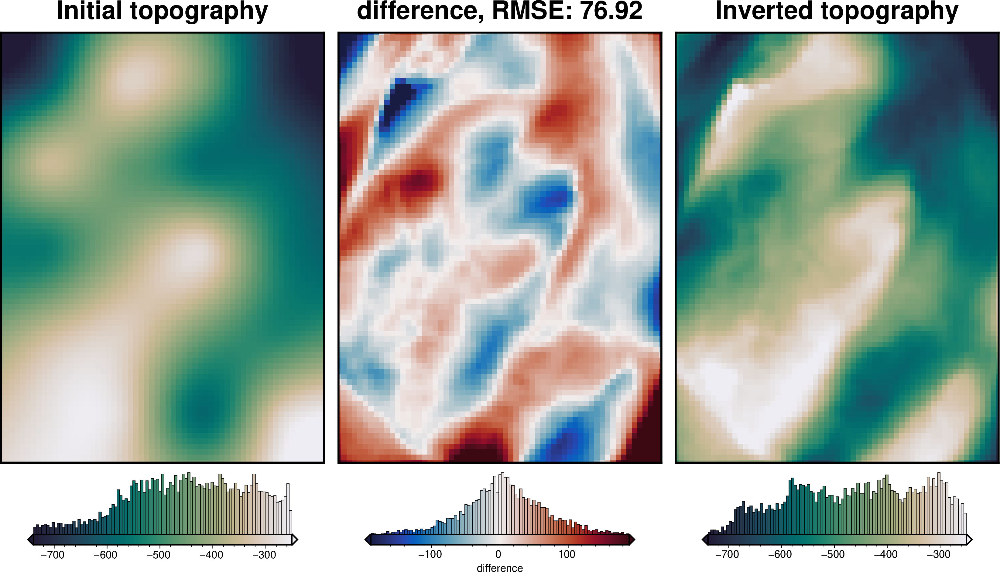

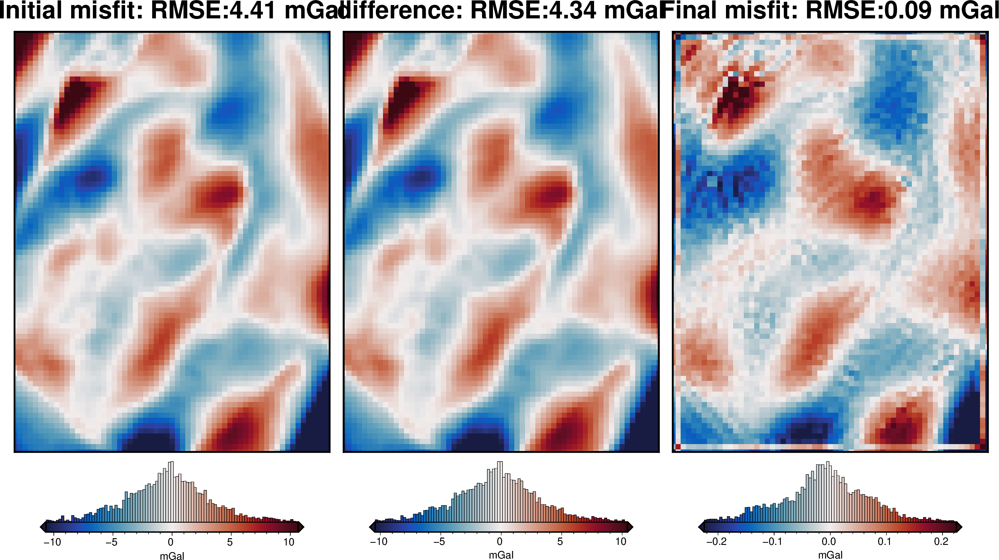

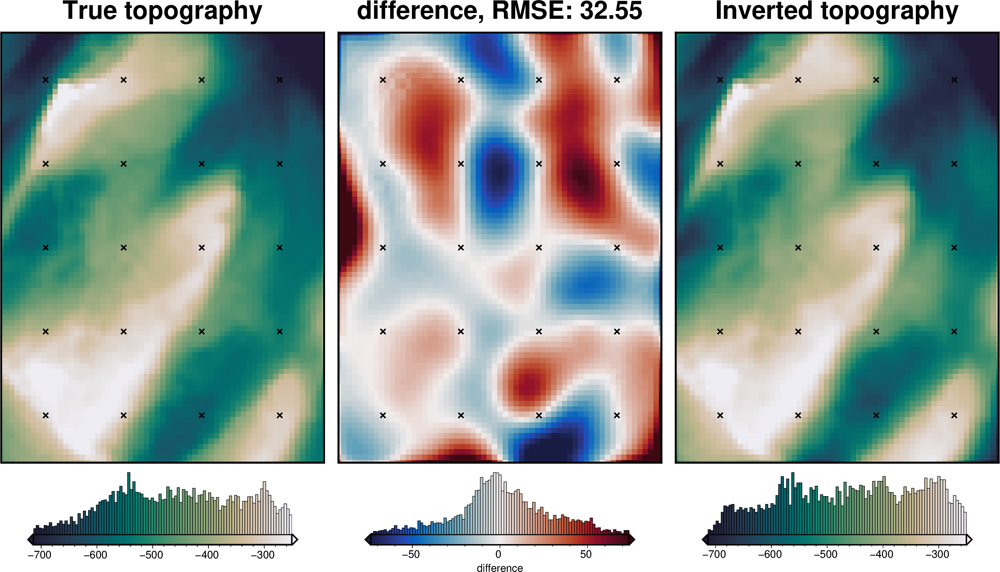

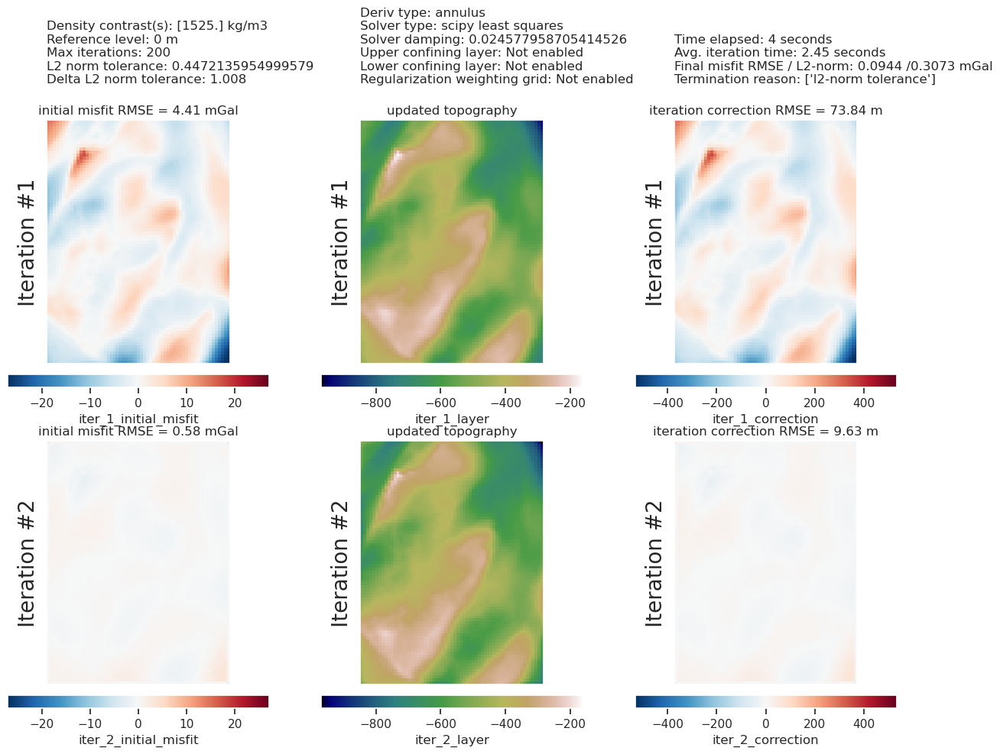

In [28]:
plotting.plot_convergence(
    grav_results,
    params=parameters,
)

plotting.plot_inversion_results(
    grav_results,
    topo_results,
    parameters,
    inversion_region,
    iters_to_plot=2,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
)

final_topography = topo_results.set_index(["northing", "easting"]).to_xarray().topo

_ = polar_utils.grd_compare(
    bathymetry,
    final_topography,
    region=inversion_region,
    plot=True,
    grid1_name="True topography",
    grid2_name="Inverted topography",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="difference",
    grounding_line=False,
    reverse_cpt=True,
    cmap="rain",
    points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
    points_style="x.2c",
)

In [29]:
# sample the inverted topography at the constraint points
constraint_points = utils.sample_grids(
    constraint_points,
    final_topography,
    "inverted_topography",
    coord_names=("easting", "northing"),
)

rmse = utils.rmse(constraint_points.upward - constraint_points.inverted_topography)
print(f"RMSE: {rmse:.2f} m")

RMSE: 3.46 m


In [30]:
# save to csv
constraint_points.to_csv("../../results/Ross_Sea_06_constraint_points.csv", index=False)

# Uncertainty analysis

## Inversion error

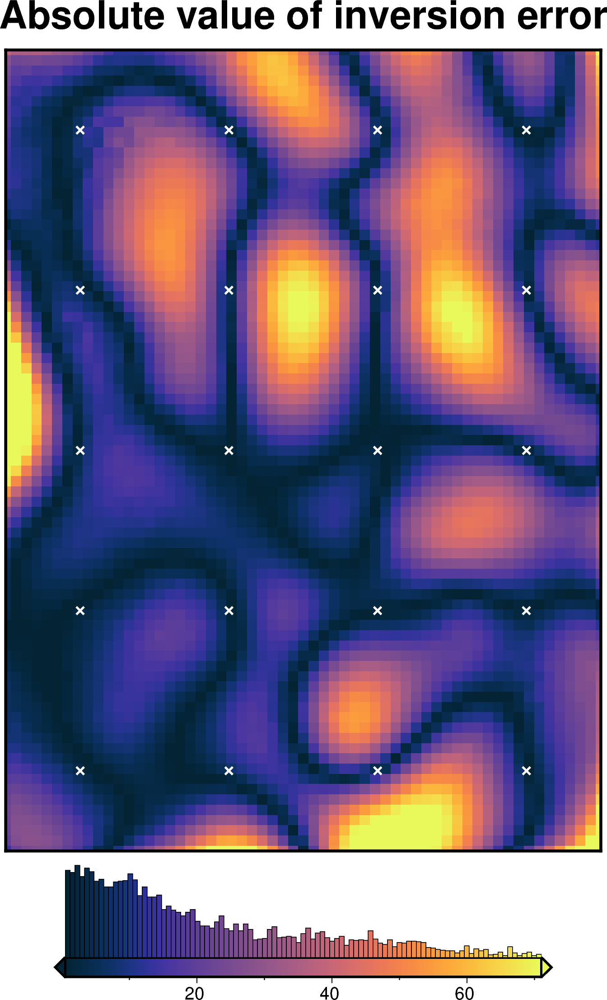

In [31]:
inversion_error = np.abs(bathymetry - final_topography)

fig = maps.plot_grd(
    inversion_error,
    region=vd.pad_region(inversion_region, -spacing),
    hist=True,
    cmap="thermal",
    title="Absolute value of inversion error",
    robust=True,
    points=constraint_points,
    points_style="x.2c",
    points_fill="white",
)
fig.show()

## Redo starting gravity and regional separation
use the optimal determined density contrast

  0%|          | 0/500 [00:00<?, ?it/s]

INFO:invert4geom:Trial with best score: 
INFO:invert4geom:	trial number: 423
INFO:invert4geom:	parameter: {'depth': 80898.37500541088, 'damping': 4.078815343597546e-09}
INFO:invert4geom:	scores: [0.22875098894957357]


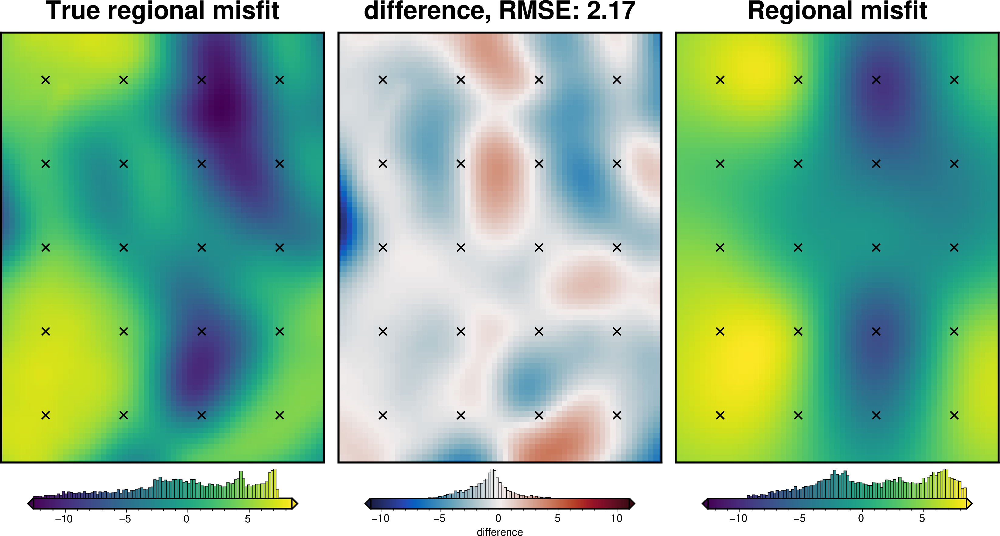

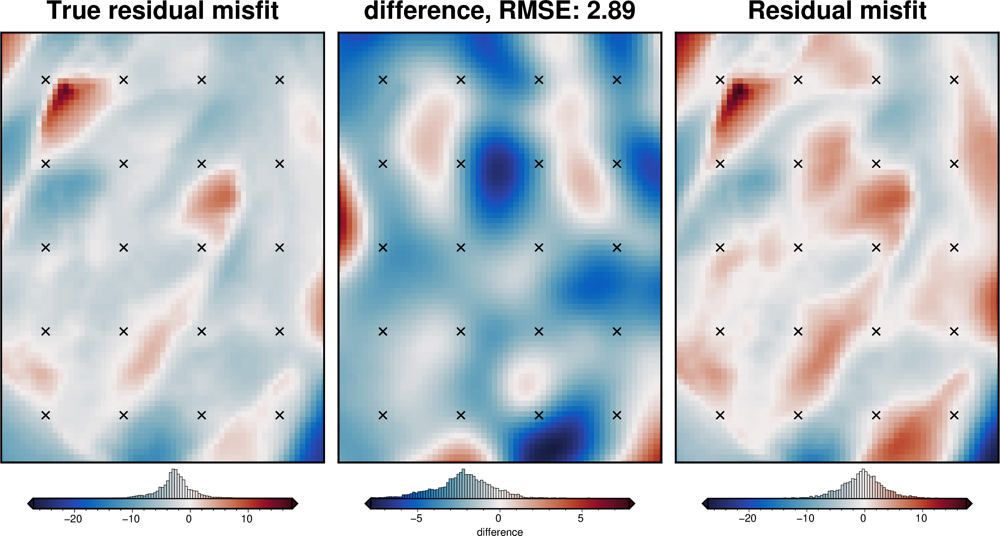

,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly,starting_gravity,true_res,misfit,reg,res
count,4.941000e+03,4941.00000,4941.0,4941.000000,4941.000000,4.941000e+03,4941.000000,4941.000000,4941.000000,4941.000000,4941.000000,4941.000000
mean,-1.600000e+06,110000.00000,1000.0,-28.076339,0.259171,7.362839e-16,-28.076339,-28.588272,-2.768688,0.511933,1.102692,-0.590758
std,1.169164e+05,88042.99419,0.0,7.267542,0.491861,4.918608e+00,10.294668,7.581124,3.562824,6.251383,4.493599,4.372322
min,-1.800000e+06,-40000.00000,1000.0,-50.834525,-1.000000,-1.259171e+01,-54.678282,-51.223185,-21.813657,-21.739338,-9.399584,-27.084853
25%,-1.700000e+06,35000.00000,1000.0,-33.380910,-0.034308,-2.934787e+00,-35.726921,-33.635888,-4.196784,-3.657662,-2.384425,-2.710214
50%,-1.600000e+06,110000.00000,1000.0,-28.037682,0.288825,2.965387e-01,-28.106720,-28.264831,-2.662141,0.720476,1.213180,-0.346499
75%,-1.500000e+06,185000.00000,1000.0,-21.983838,0.677359,4.181878e+00,-20.290869,-22.727478,-1.171641,5.092128,5.302245,1.742149
max,-1.400000e+06,260000.00000,1000.0,-13.088736,1.000000,7.408290e+00,-6.187838,-11.583646,15.502742,24.747768,8.481240,17.557746


In [32]:
# set the reference level from the prisms to 0
zref = 0
density_grid = xr.where(
    starting_bathymetry >= zref,
    best_density_contrast,
    -best_density_contrast,
)
# create layer of prisms
starting_prisms = utils.grids_to_prisms(
    starting_bathymetry,
    zref,
    density=density_grid,
)
grav_df["starting_gravity"] = starting_prisms.prism_layer.gravity(
    coordinates=(
        grav_df.easting,
        grav_df.northing,
        grav_df.upward,
    ),
    field="g_z",
    progressbar=False,
)

# regional separation
temp_reg_kwargs = copy.deepcopy(regional_grav_kwargs)

# temporarily set some kwargs
temp_reg_kwargs["cv_kwargs"]["plot"] = True
temp_reg_kwargs["cv_kwargs"]["progressbar"] = True

grav_df = regional.regional_separation(
    grav_df=grav_df,
    **temp_reg_kwargs,
)

regional_comparison(grav_df)
grav_df.describe()

In [33]:
# use optimal eq source parameters for regional separation in uncertainty analysis

# re-load the study from the saved pickle file
with pathlib.Path(f"{regional_grav_kwargs.get('cv_kwargs').get('fname')}.pickle").open(
    "rb"
) as f:
    study = pickle.load(f)
reg_eq_damping = min(study.best_trials, key=lambda t: t.values[0]).params["damping"]
reg_eq_depth = min(study.best_trials, key=lambda t: t.values[0]).params["depth"]

new_regional_grav_kwargs = dict(
    method="constraints",
    grid_method="eq_sources",
    constraints_df=constraint_points,
    damping=reg_eq_damping,
    depth=reg_eq_depth,
    block_size=None,
)
reg_eq_damping, reg_eq_depth

(4.078815343597546e-09, 80898.37500541088)

In [34]:
# add best damping parameter to kwargs
kwargs["solver_damping"] = best_damping

# kwargs to reuse for all uncertainty analyses
uncert_kwargs = dict(
    grav_df=grav_df,
    density_contrast=best_density_contrast,
    zref=zref,
    starting_prisms=starting_prisms,
    starting_topography=starting_bathymetry,
    regional_grav_kwargs=new_regional_grav_kwargs,
    **kwargs,
)

## Solver damping component

In [ ]:
# load study
with pathlib.Path("../../results/Ross_Sea_06_damping_cv_damping_cv_study.pickle").open(
    "rb"
) as f:
    study = pickle.load(f)

study_df = study.trials_dataframe().drop(columns=["user_attrs_results"])
study_df = study_df.sort_values("value")

# calculate zscores of values
study_df["value_zscore"] = sp.stats.zscore(study_df["value"])

# drop outliers (values with zscore > |2|)
study_df2 = study_df[(np.abs(study_df.value_zscore) < 2)]

# pick damping standard deviation based on optimization
stdev = np.log10(study_df2.params_damping).std()
print(f"calculated stdev: {stdev}")
stdev = 0.1
print(f"using stdev: {stdev}")

calculated stdev: 0.26818226407855356
using stdev: 0.1


best: 0.024577958705414526 
std: 0.1 
+1std: 0.03094181678427402 
-1std: 0.0195229665515982


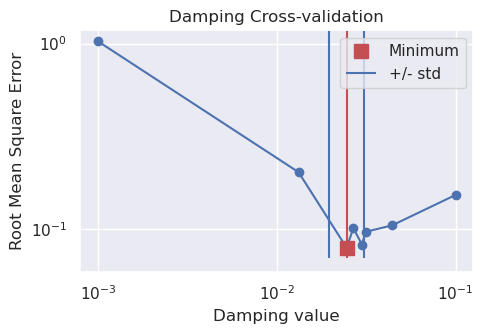

In [91]:
fig = plotting.plot_cv_scores(
    study_df.value,
    study_df.params_damping,
    param_name="Damping",
    logx=True,
    logy=True,
)
ax = fig.axes[0]

best = float(study_df2.params_damping.iloc[0])
upper = float(10 ** (np.log10(best) + stdev))
lower = float(10 ** (np.log10(best) - stdev))

y_lims = ax.get_ylim()
ax.vlines(best, ymin=y_lims[0], ymax=y_lims[1], color="r")
ax.vlines(upper, ymin=y_lims[0], ymax=y_lims[1], label="+/- std")
ax.vlines(lower, ymin=y_lims[0], ymax=y_lims[1])

x_lims = ax.get_xlim()
ax.set_xlim(
    min(x_lims[0], lower),
    max(x_lims[1], upper),
)
ax.legend()
print("best:", best, "\nstd:", stdev, "\n+1std:", upper, "\n-1std:", lower)

INFO:invert4geom:Sampled 'solver_damping' parameter values; mean: 0.025156215718096498, min: 0.016829082812822183, max: 0.035894769836465015
INFO:invert4geom:all 10 runs already complete, loading results from files.


stochastic ensemble: 0it [00:00, ?it/s]

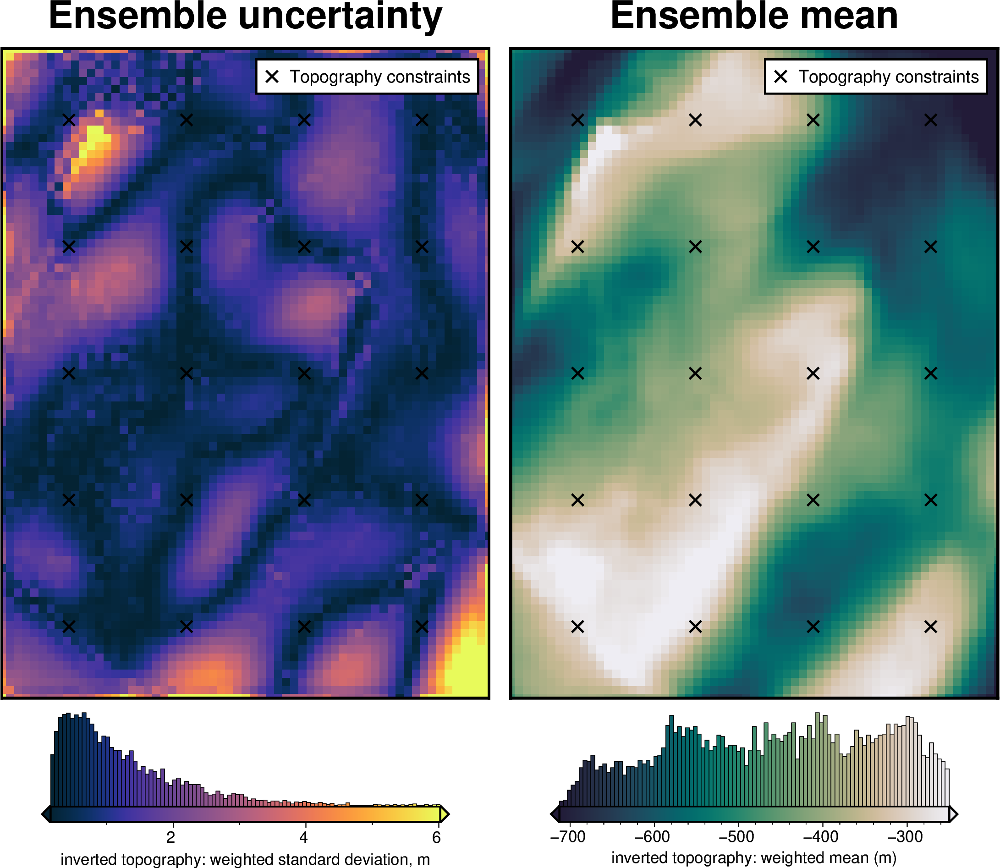

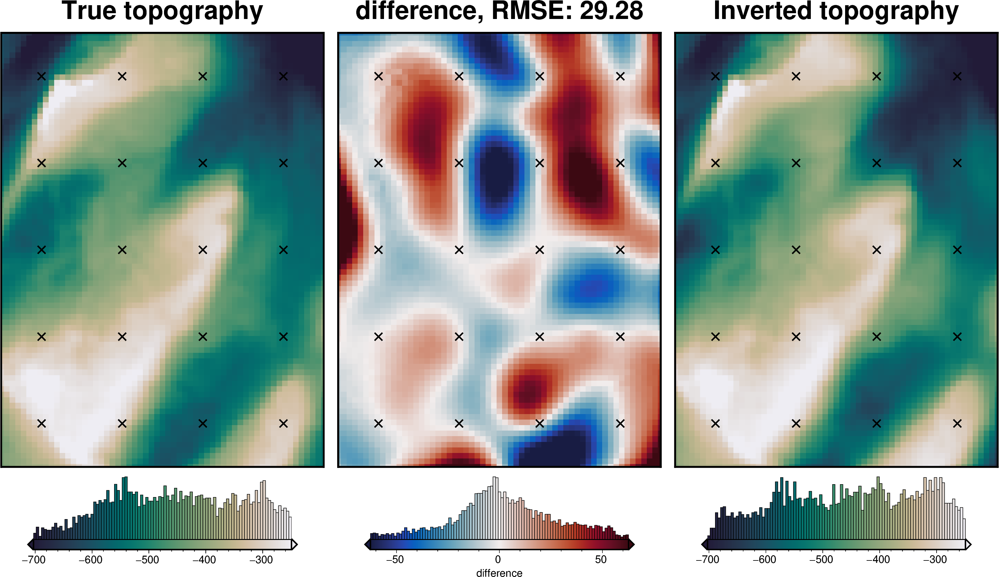

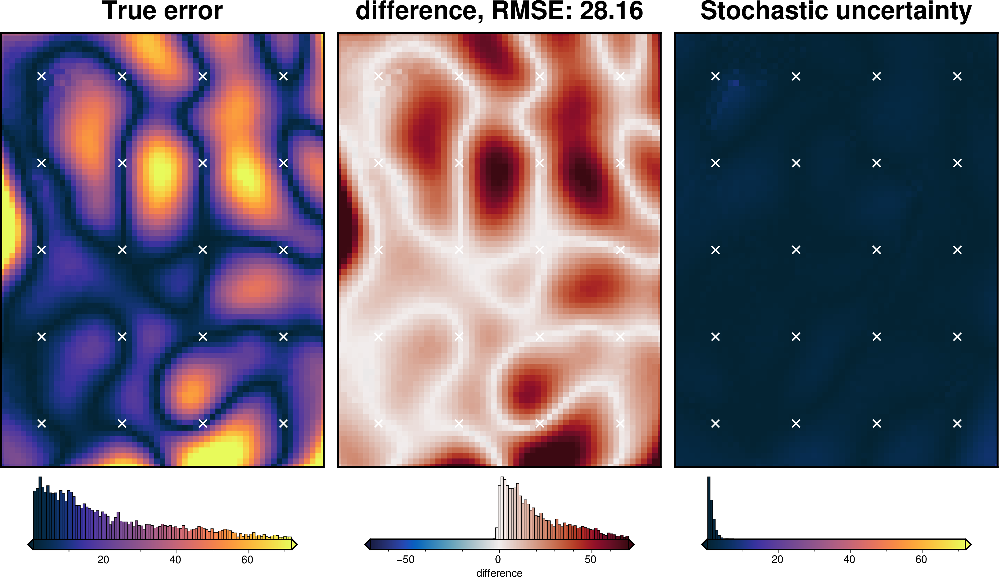

In [92]:
solver_dict = {
    "solver_damping": {
        "distribution": "normal",
        "loc": np.log10(best_damping),  # mean of base 10 exponent
        "scale": stdev,  # 0.2,  # standard deviation of base 10 exponent
        "log": True,
    },
}
fname = "../../results/Ross_Sea_06_uncertainty_damping"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_damping_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=10,
    parameter_dict=solver_dict,
    **uncert_kwargs,
)

stats_ds = RIS_plotting.uncert_plots(
    uncert_damping_results,
    inversion_region,
    spacing,
    bathymetry,
    constraint_points=constraint_points,
    weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
)

## Density component

In [ ]:
# load study
with pathlib.Path("../../results/Ross_Sea_06_density_cv_study.pickle").open("rb") as f:
    study = pickle.load(f)

study_df = study.trials_dataframe()
study_df = study_df.sort_values("value")

# calculate zscores of values
study_df["value_zscore"] = sp.stats.zscore(study_df["value"])

# drop outliers (values with zscore > |2|)
study_df2 = study_df[(np.abs(study_df.value_zscore) < 2)]

stdev = study_df2.params_density_contrast.std()
print(f"calculated stdev: {stdev}")

# manually pick a stdev
# stdev = 5
print(f"using stdev: {stdev}")

calculated stdev: 65.23068878524897
using stdev: 65.23068878524897


best: 1525.0 
std: 65.23068878524897 
+1std: 1590.230688785249 
-1std: 1459.769311214751


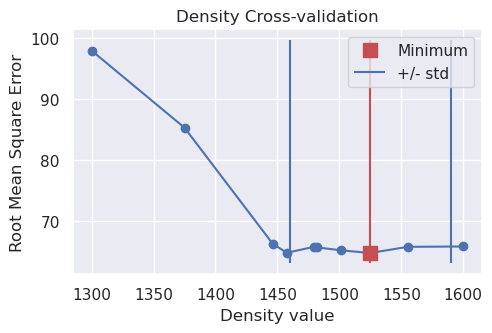

In [94]:
fig = plotting.plot_cv_scores(
    study.trials_dataframe().value.values,
    study.trials_dataframe().params_density_contrast.values,
    param_name="Density",
    logx=False,
    logy=False,
)
ax = fig.axes[0]

best = study_df2.params_density_contrast.iloc[0]
upper = best + stdev
lower = best - stdev

y_lims = ax.get_ylim()
ax.vlines(best, ymin=y_lims[0], ymax=y_lims[1], color="r")
ax.vlines(upper, ymin=y_lims[0], ymax=y_lims[1], label="+/- std")
ax.vlines(lower, ymin=y_lims[0], ymax=y_lims[1])

x_lims = ax.get_xlim()
ax.set_xlim(
    min(x_lims[0], lower),
    max(x_lims[1], upper),
)
ax.legend()
print("best:", best, "\nstd:", stdev, "\n+1std:", upper, "\n-1std:", lower)

INFO:invert4geom:Sampled 'density_contrast' parameter values; mean: 1525.0, min: 1417.7050649630405, max: 1632.2949350369595
INFO:invert4geom:all 10 runs already complete, loading results from files.


stochastic ensemble: 0it [00:00, ?it/s]

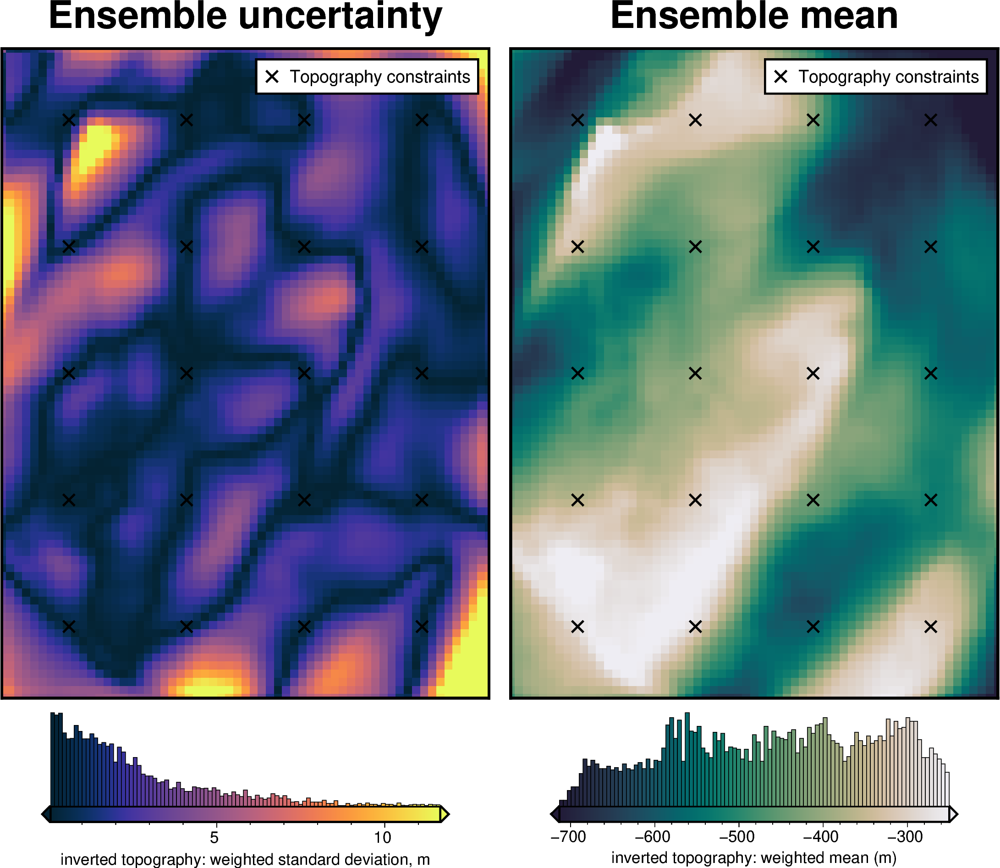

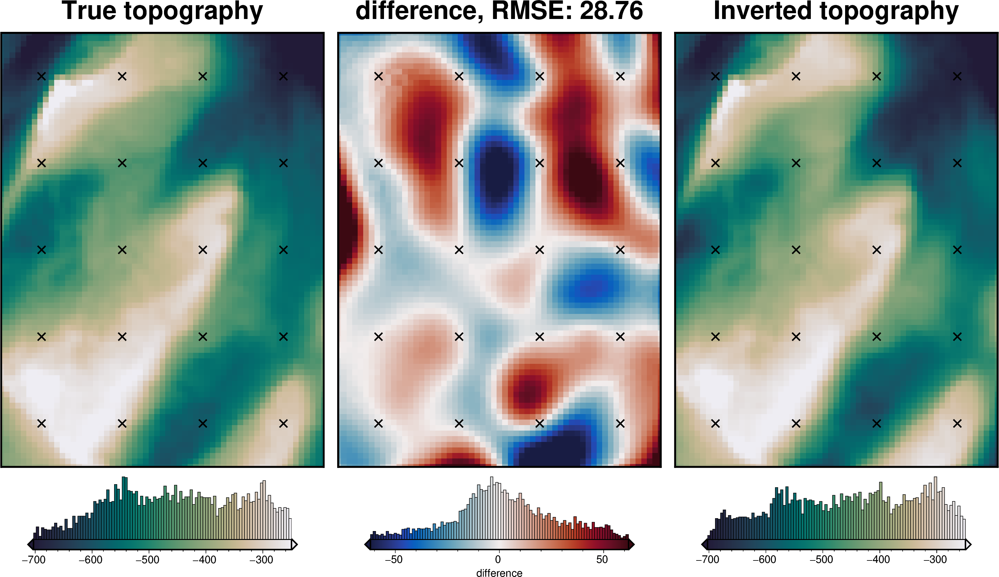

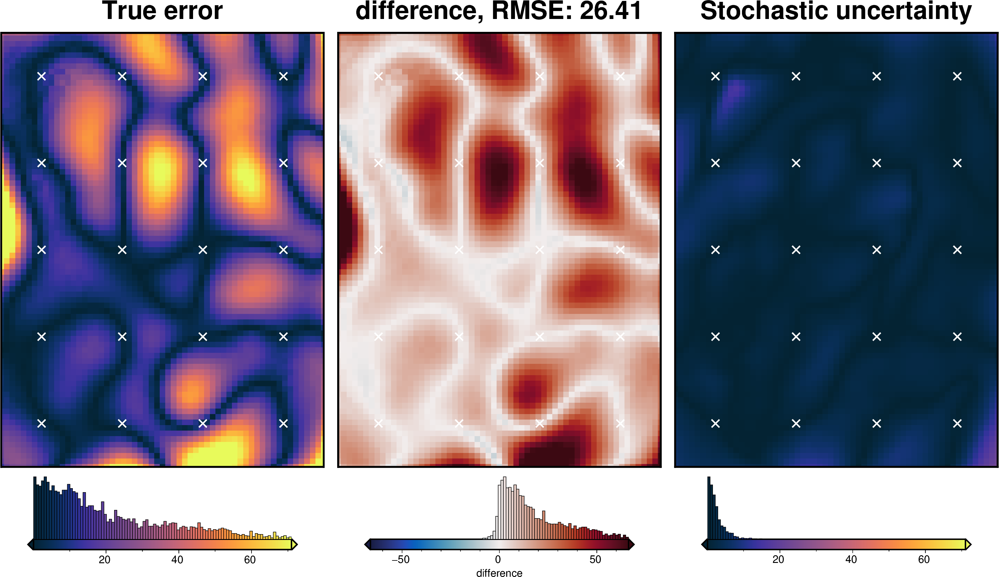

In [95]:
density_dict = {
    "density_contrast": {
        "distribution": "normal",
        "loc": best_density_contrast,
        "scale": stdev,
    },
}
fname = "../../results/Ross_Sea_06_uncertainty_density"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_density_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=10,
    parameter_dict=density_dict,
    **uncert_kwargs,
)

stats_ds = RIS_plotting.uncert_plots(
    uncert_density_results,
    inversion_region,
    spacing,
    bathymetry,
    constraint_points=constraint_points,
    weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
)

## Regional gravity component

In [53]:
# # if depth="default" in EquivalentSources, it will use 4.5 times the mean distances
# # between nearest points as the depth
# # calculate that mean distance below.
# mean_constraint_distance = np.mean(
#     vd.median_distance(
#         (constraint_points.easting, constraint_points.northing), k_nearest=1
#     )
# )
# mean_constraint_distance

In [35]:
reg_eq_damping, reg_eq_depth

(4.078815343597546e-09, 80898.37500541088)

In [37]:
np.log10(reg_eq_damping)

np.float64(-8.389465955646845)

INFO:invert4geom:Sampled 'depth' parameter values; mean: 80898.3750054109, min: -335862.4348914398, max: 497659.1849022614
INFO:invert4geom:Sampled 'damping' parameter values; mean: 0.8436003635914939, min: 2.0286953332092706e-19, max: 82.007063036165


starting regional ensemble:   0%|          | 0/100 [00:00<?, ?it/s]

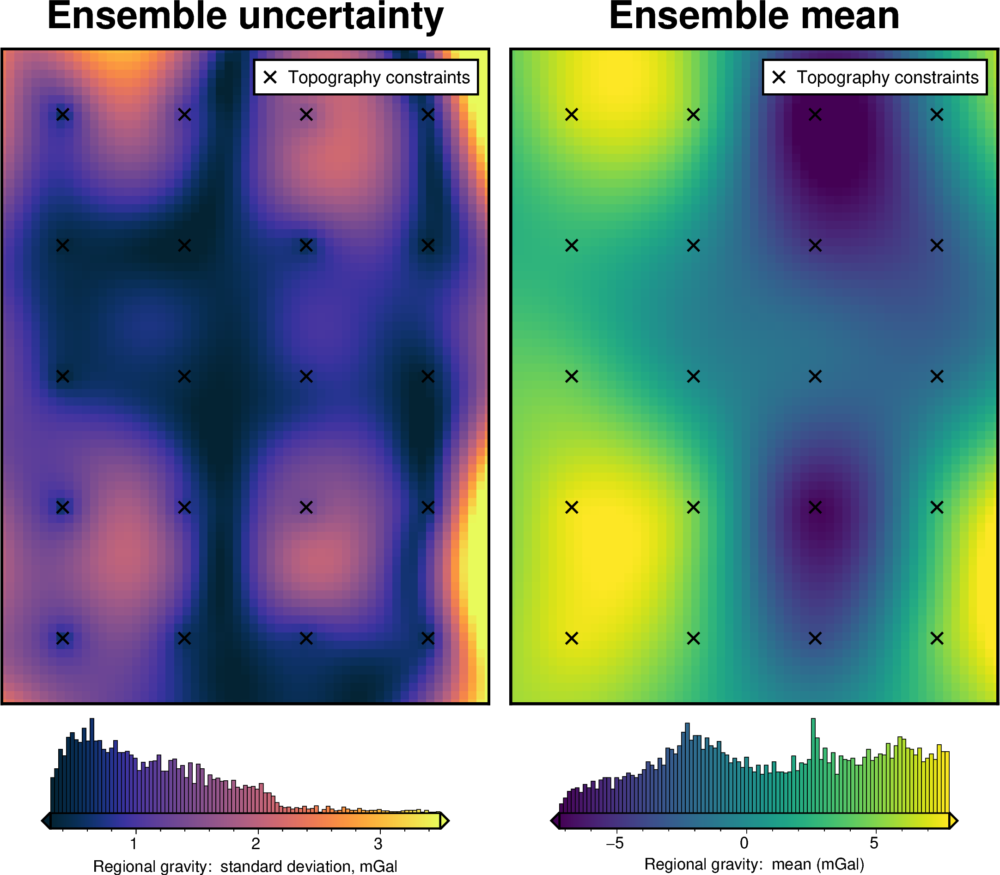

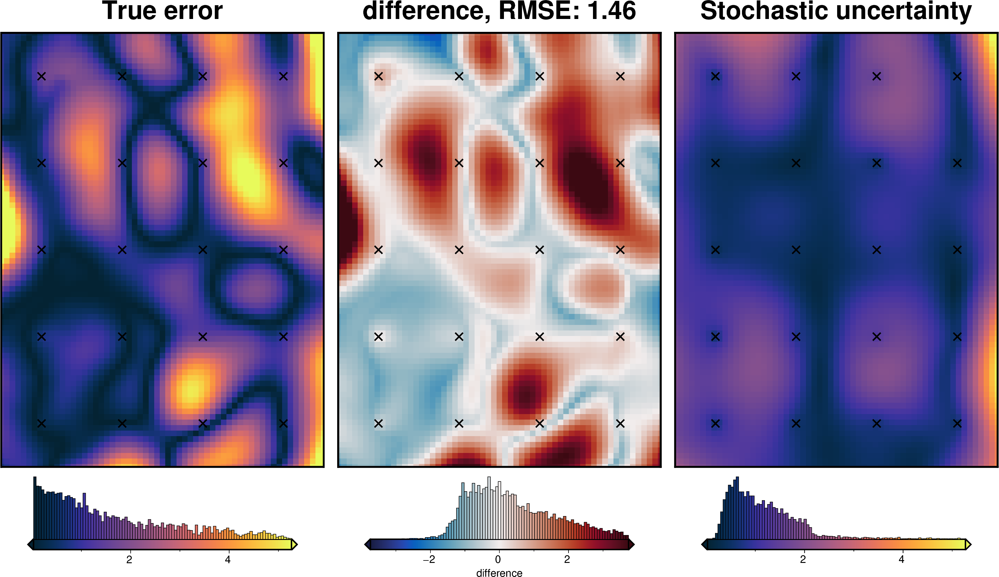

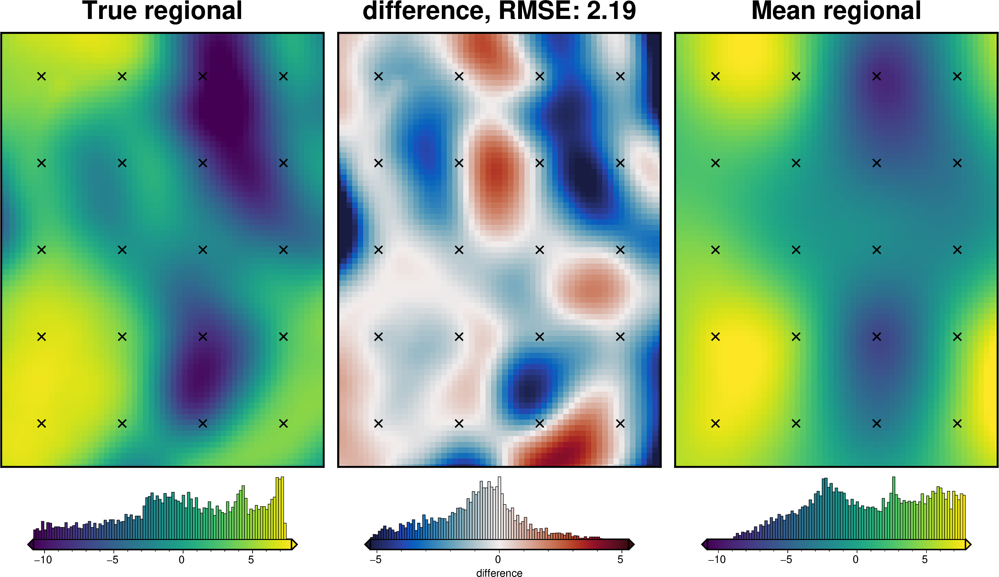

In [38]:
regional_misfit_parameter_dict = {
    "depth": {
        # "distribution": "uniform",
        # "loc": 1 * mean_constraint_distance,  # lower bound
        # "scale": 10 * mean_constraint_distance,  # range
        "distribution": "normal",
        "loc": reg_eq_depth,  # mean
        "scale": reg_eq_depth * 2,  # standard deviation
    },
    "damping": {
        "distribution": "normal",
        "loc": np.log10(reg_eq_damping),  # mean base 10 exponent
        "scale": 4,  # np.abs(np.log10(reg_eq_damping)),  # standard deviation of exponent
        "log": True,
    },
}

regional_misfit_stats = uncertainty.regional_misfit_uncertainty(
    runs=100,
    parameter_dict=regional_misfit_parameter_dict,
    plot_region=vd.pad_region(inversion_region, -spacing),
    true_regional=grav_grid.basement_grav,
    # weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
    grav_df=grav_df,
    **new_regional_grav_kwargs,
)

In [39]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()
grav_grid["reg_uncert"] = regional_misfit_stats.z_stdev
grav_df = vd.grid_to_table(grav_grid)
grav_df

,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly,starting_gravity,true_res,misfit,reg,res,reg_uncert
0,-1800000.0,-40000.0,1000.0,-28.046289,0.830177,5.710065,-22.336224,-18.413437,-11.745870,-3.922787,5.365996,-9.288784,2.838591
1,-1800000.0,-35000.0,1000.0,-26.714502,0.867672,6.085010,-20.629492,-18.152997,-10.644636,-2.476496,5.457999,-7.934495,2.665995
2,-1800000.0,-30000.0,1000.0,-25.919276,0.898289,6.391175,-19.528100,-17.899238,-10.074049,-1.628863,5.543308,-7.172170,2.499328
3,-1800000.0,-25000.0,1000.0,-25.236960,0.921973,6.628021,-18.608940,-17.655357,-9.607628,-0.953582,5.620326,-6.573908,2.339424
4,-1800000.0,-20000.0,1000.0,-24.610928,0.937189,6.780179,-17.830750,-17.423734,-9.186639,-0.407016,5.687376,-6.094392,2.187283
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4936,-1400000.0,240000.0,1000.0,-48.323584,0.243973,-0.151982,-48.475566,-47.543901,-6.235540,-0.931665,1.690738,-2.622403,4.203983
4937,-1400000.0,245000.0,1000.0,-48.356131,0.167427,-0.917439,-49.273571,-48.204805,-5.683026,-1.068766,1.918874,-2.987641,4.902143
4938,-1400000.0,250000.0,1000.0,-49.079005,0.076264,-1.829069,-50.908074,-48.816424,-5.864466,-2.091650,2.099440,-4.191090,5.618020
4939,-1400000.0,255000.0,1000.0,-49.877171,-0.022265,-2.814361,-52.691532,-49.377410,-6.166022,-3.314122,2.236867,-5.550989,6.347261


In [40]:
# save to csv
grav_df.to_csv("../../results/Ross_Sea_06_grav_df.csv", index=False)

INFO:invert4geom:Sampled 'depth' parameter values; mean: 80898.37500541087, min: -185233.5960788501, max: 347030.3460896717
INFO:invert4geom:Sampled 'damping' parameter values; mean: 0.001554557398908591, min: 1.0742850611719555e-15, max: 0.01548633152267554
INFO:invert4geom:all 10 runs already complete, loading results from files.


stochastic ensemble: 0it [00:00, ?it/s]

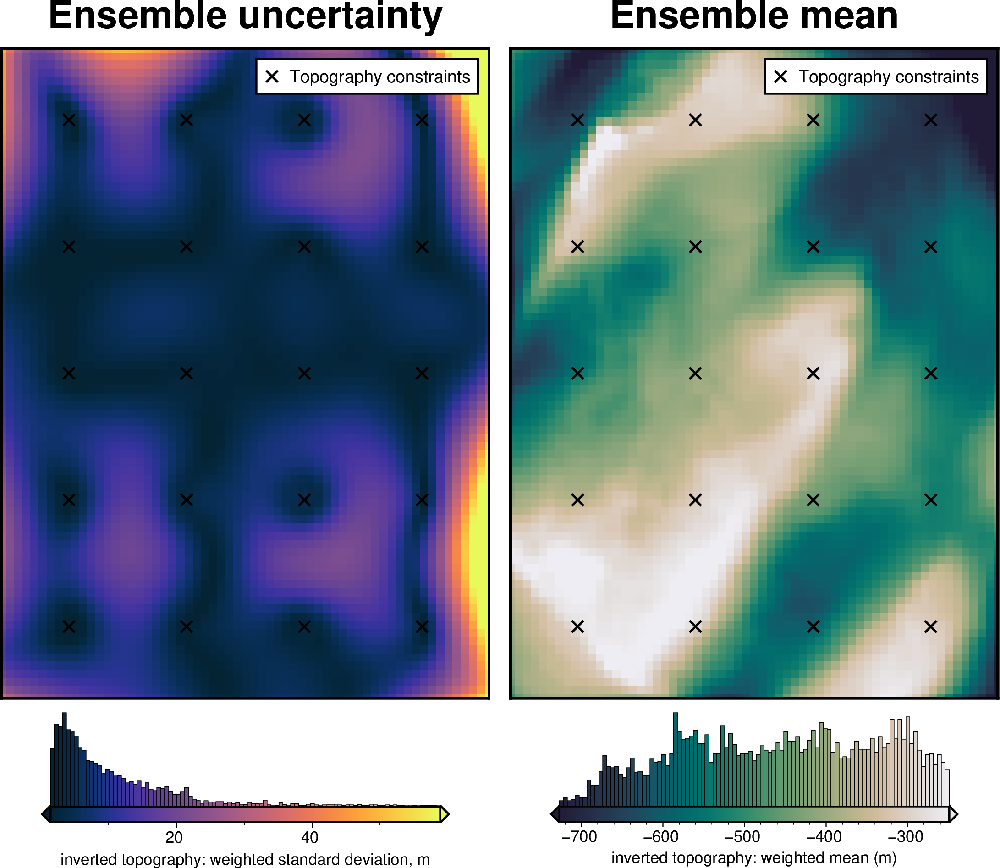

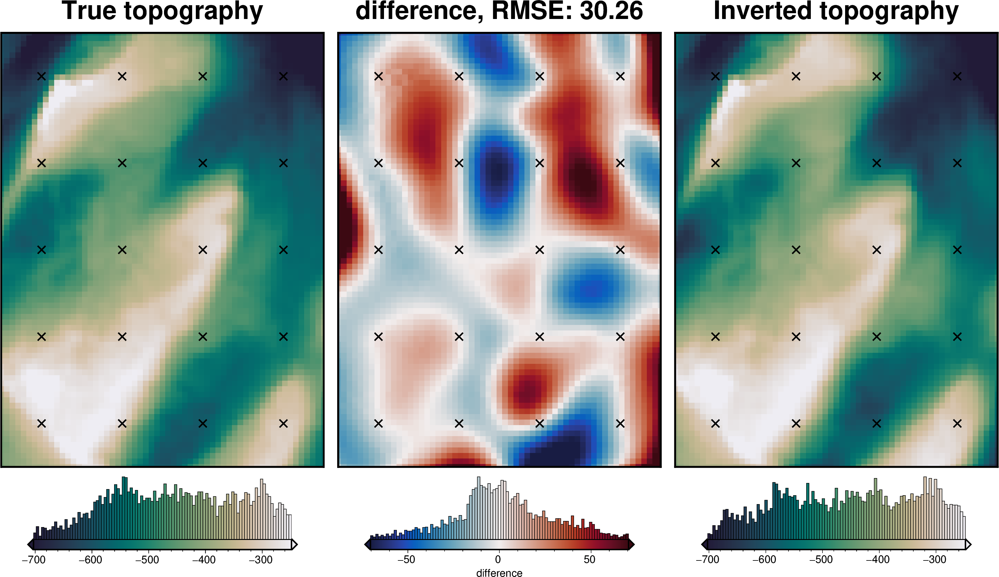

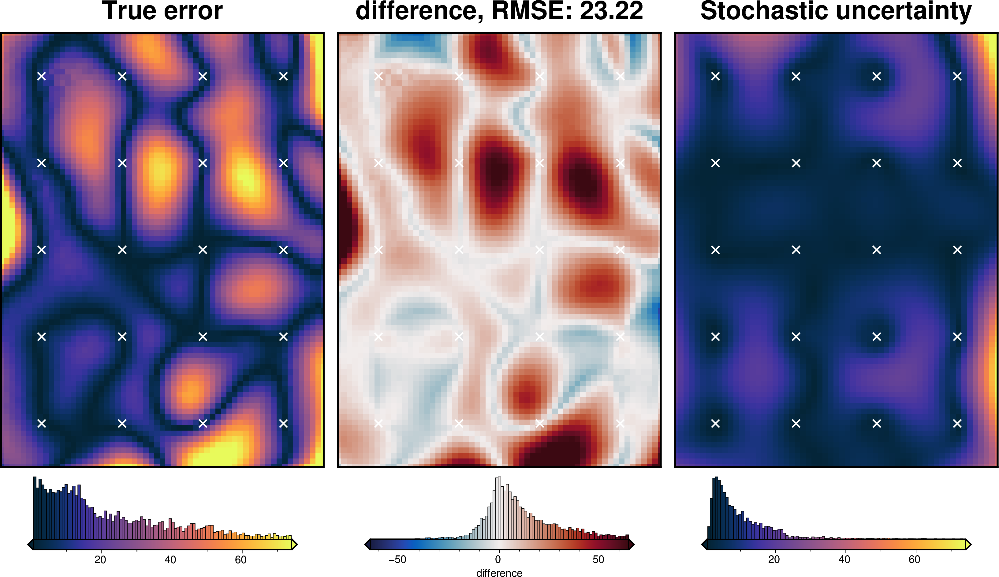

In [98]:
fname = "../../results/Ross_Sea_06_uncertainty_regional"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_regional_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=10,
    regional_misfit_parameter_dict=regional_misfit_parameter_dict,
    **uncert_kwargs,
)

stats_ds = RIS_plotting.uncert_plots(
    uncert_regional_results,
    inversion_region,
    spacing,
    bathymetry,
    constraint_points=constraint_points,
    weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
)

## Total uncertainty

INFO:invert4geom:Sampled 'solver_damping' parameter values; mean: 0.025195863766263725, min: 0.01565126380996487, max: 0.03859599208470677
INFO:invert4geom:Sampled 'density_contrast' parameter values; mean: 1525.0000000000002, min: 1397.1501992941712, max: 1652.849800705829
INFO:invert4geom:Sampled 'depth' parameter values; mean: 80898.37500541091, min: -236217.42783143045, max: 398014.1778422524
INFO:invert4geom:Sampled 'damping' parameter values; mean: 0.014230969860317234, min: 5.897637923597076e-17, max: 0.2820914885364824
INFO:invert4geom:all 20 runs already complete, loading results from files.


stochastic ensemble: 0it [00:00, ?it/s]

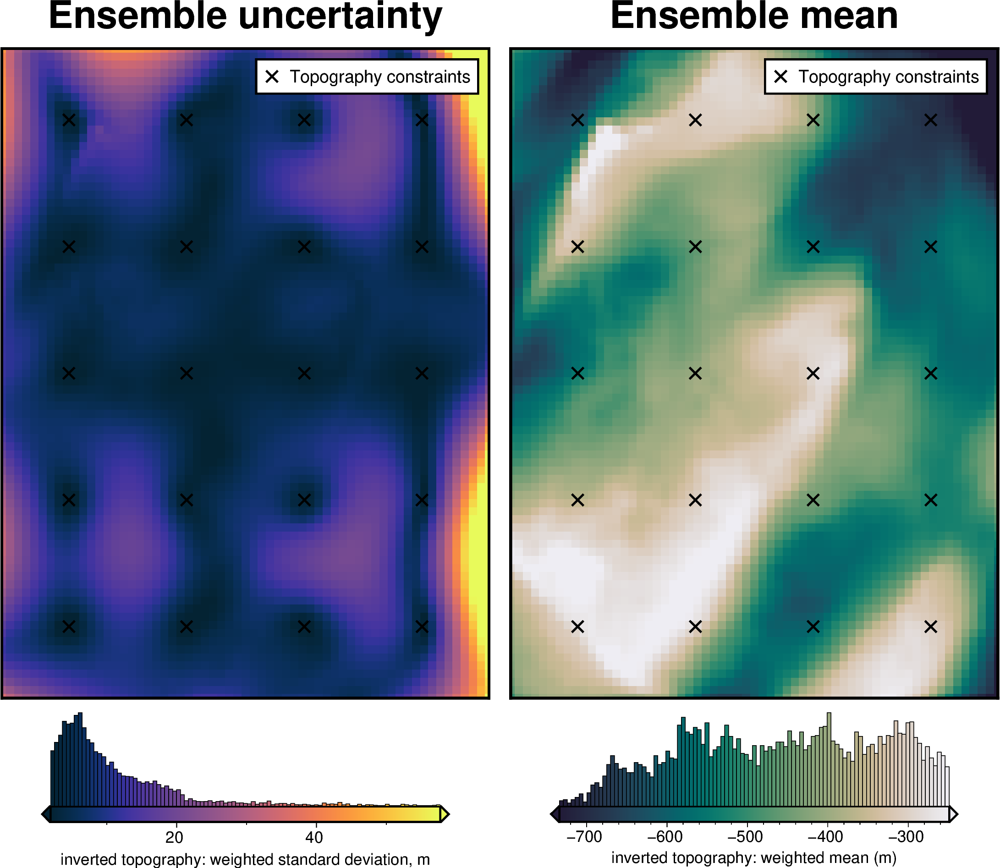

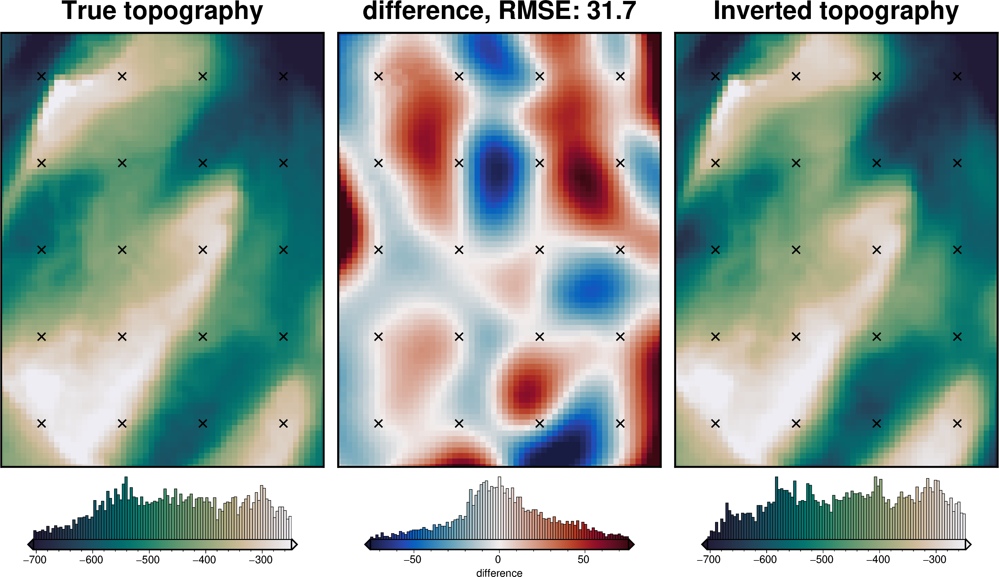

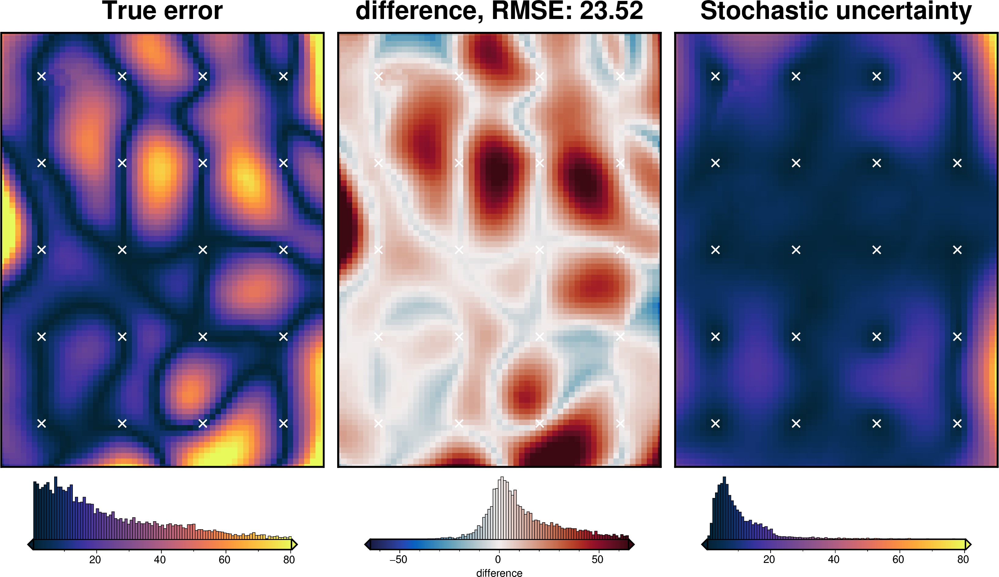

In [99]:
fname = "../../results/Ross_Sea_06_uncertainty_full"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=20,
    parameter_dict=solver_dict | density_dict,
    regional_misfit_parameter_dict=regional_misfit_parameter_dict,
    **uncert_kwargs,
)

stats_ds = RIS_plotting.uncert_plots(
    uncert_results,
    inversion_region,
    spacing,
    bathymetry,
    constraint_points=constraint_points,
    weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
)

### Comparing results

In [100]:
results = [
    uncert_results,
    uncert_regional_results,
    uncert_density_results,
    uncert_damping_results,
]

# get cell-wise stats for each ensemble
stats = []
for r in results:
    ds = uncertainty.merged_stats(
        results=r,
        plot=False,
        constraints_df=constraint_points,
        weight_by="constraints",
        region=vd.pad_region(inversion_region, -spacing),
    )
    stats.append(ds)

In [101]:
names = [
    "full",
    "regional",
    "density",
    "damping",
]

# get the standard deviation of the ensemble of ensembles
stdevs = []
for i, s in enumerate(stats):
    stdevs.append(s.weighted_stdev.rename(f"{names[i]}_stdev"))

merged = xr.merge(stdevs)
merged

<xarray.Dataset> Size: 150kB
Dimensions:         (northing: 79, easting: 59)
Coordinates:
  * northing        (northing) float64 632B -1.795e+06 -1.79e+06 ... -1.405e+06
  * easting         (easting) float64 472B -3.5e+04 -3e+04 ... 2.5e+05 2.55e+05
Data variables:
    full_stdev      (northing, easting) float64 37kB 25.24 22.59 ... 80.36 96.17
    regional_stdev  (northing, easting) float64 37kB 22.95 21.04 ... 92.09 112.1
    density_stdev   (northing, easting) float64 37kB 7.787 6.57 ... 11.05 13.67
    damping_stdev   (northing, easting) float64 37kB 4.002 2.56 ... 2.288 4.573

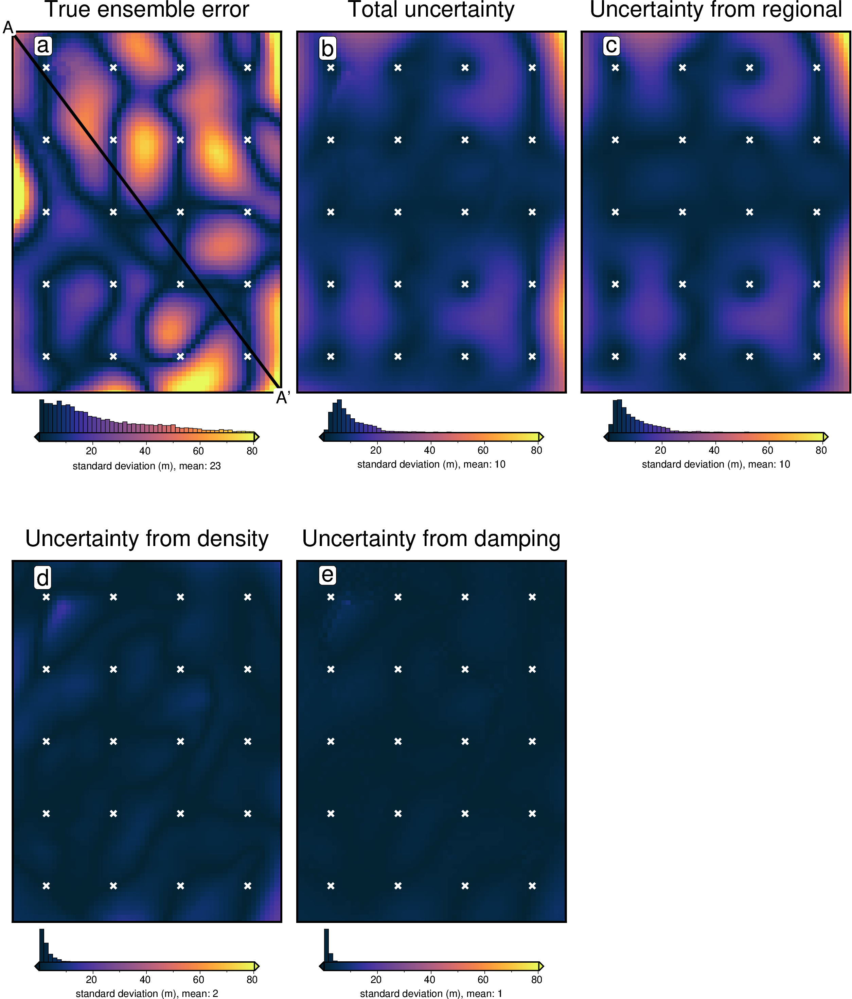

In [102]:
titles = [
    "True ensemble error",
    # "True indiv error",
    "Total uncertainty",
    "Uncertainty from regional",
    "Uncertainty from density",
    "Uncertainty from damping",
]
grids = list(merged.data_vars.values())

grids.insert(0, np.abs(stats[0].weighted_mean - bathymetry))

# cpt_lims = polar_utils.get_min_max(grids[0], robust=True,)
cpt_lims = polar_utils.get_combined_min_max(grids, robust=True)

fig_height = 9
for i, g in enumerate(grids):
    xshift_amount = 1
    if i == 0:
        fig = None
        origin_shift = "initialize"
    elif i == 3:
        origin_shift = "both_shift"
        xshift_amount = -2
    else:
        origin_shift = "xshift"

    fig = maps.plot_grd(
        grid=g,
        fig_height=fig_height,
        # region=vd.pad_region(inversion_region, -3*spacing),
        title=titles[i],
        title_font="16p,Helvetica,black",
        cmap="thermal",
        cpt_lims=cpt_lims,
        robust=True,
        cbar_label=f"standard deviation (m), mean: {int(np.nanmean(g))}",
        hist=True,
        hist_bin_num=50,
        cbar_yoffset=1,
        fig=fig,
        origin_shift=origin_shift,
        xshift_amount=xshift_amount,
        yshift_amount=-1.1,
    )
    fig.plot(
        x=constraint_points.easting,
        y=constraint_points.northing,
        style="x.2c",
        fill="white",
        pen="1.5p,white",
    )
    fig.text(
        position="TL",
        text=f"{string.ascii_lowercase[i]}",
        fill="white",
        pen=True,
        font="16p,Helvetica,black",
        offset="j.6/.2",
        clearance="+tO",
        no_clip=True,
    )
    if i == 0:
        # plot profiles location, and endpoints on map
        start = [inversion_region[0], inversion_region[3]]
        stop = [inversion_region[1], inversion_region[2]]
        fig.plot(
            vd.line_coordinates(start, stop, size=100),
            pen="2p,black",
        )
        fig.text(
            x=start[0],
            y=start[1],
            text="A",
            fill="white",
            font="12p,Helvetica,black",
            justify="CM",
            clearance="+tO",
            no_clip=True,
        )
        fig.text(
            x=stop[0],
            y=stop[1],
            text="A' ",
            fill="white",
            font="12p,Helvetica,black",
            justify="CM",
            clearance="+tO",
            no_clip=True,
        )
fig.show()

grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).


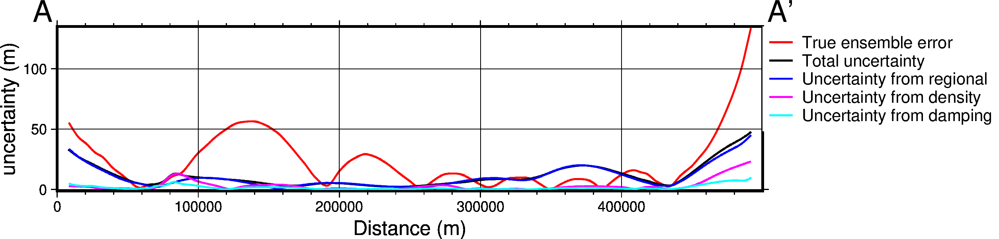

In [103]:
data_dict = profiles.make_data_dict(
    names=titles,
    grids=grids,
    colors=[
        "red",
        "black",
        "blue",
        "magenta",
        "cyan",
        "green",
        "purple",
    ],
)

fig, df_data = profiles.plot_data(
    "points",
    start=[inversion_region[0], inversion_region[3]],
    stop=[inversion_region[1], inversion_region[2]],
    num=10000,
    fig_height=4,
    fig_width=15,
    data_dict=data_dict,
    data_legend_loc="jTR+jTL",
    data_legend_box="+gwhite",
    data_buffer=0.01,
    data_frame=["neSW", "xafg+lDistance (m)", "yag+luncertainty (m)"],
    # data_pen_style=[None,None,"4_2:2p"],
    # data_pen_thickness=[1, 1.5, 1],
    share_yaxis=True,
    start_label="A",
    end_label="A' ",
)
fig.show()

In [104]:
# save results
merged.to_netcdf("../../results/Ross_Sea_06_sensitivity.nc")

In [106]:
stats_ds.to_netcdf("../../results/Ross_Sea_06_uncertainty.nc")